In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial import cKDTree
from tqdm import tqdm

In [2]:
#Data normalization function
def normalize_dataframe(df, columns_to_normalize):
    # Create a copy of the dataframe
    df_normalized = df.copy()

    # Replace missing values with 0 in the selected columns
    #df_normalized[columns_to_normalize] = df_normalized[columns_to_normalize].fillna(0)

    # Normalize selected columns
    scaler = StandardScaler()
    scaled_values = scaler.fit_transform(df_normalized[columns_to_normalize].values)
    df_normalized[columns_to_normalize] = scaled_values

    return df_normalized

In [ ]:
full_df = pd.read_csv('/full_df_for_classification.csv')

In [79]:
full_df_seconddataset = pd.read_csv('D:/Mari_Second_Dataset_Analysis/full_df_for_classification.csv')

In [4]:
columns_to_normalize = [
#'Local_Cell_Density', 
 'Speed',
 'Acceleration',
 'Motion_Angle_Z',
 'Motion_Angle_Y',
 'Motion_Angle_X',
 'DISPLACEMENT_Z',
 'DISPLACEMENT_Z_ABS',
 'DISPLACEMENT_Z_SUMMED',
 'Displacement',
 'Edge_xy_angle',
 'Directional_Change',
 'Directional_Change_Abs',
 'Displacement_summed',
 'Directional_Change_Summed',
 'nuc_Radius',
 'nuc_Surface_Area',
 'nuc_Eccentricity_Comp_First',
 'nuc_Eccentricity_Comp_Second',
 'nuc_Eccentricity_Comp_Third',
 'nuc_Cell_Axis_Z',
 'nuc_Cell_Axis_Y',
 'nuc_Cell_Axis_X',
 'mem_nuc_offset',
 'mem_Radius',
 'mem_Surface_Area',
 'mem_Eccentricity_Comp_First',
 'mem_Eccentricity_Comp_Second',
 'mem_Eccentricity_Comp_Third',
 'mem_Cell_Axis_Z',
 'mem_Cell_Axis_Y',
 'mem_Cell_Axis_X',
 'mem_2d_area',
 'mem_2d_perimeter',
 'mem_2d_eccentricity',
 'mem_2d_solidity',
 'mem_2d_extent',
 'mem_2d_axis_major_length',
 'mem_2d_axis_minor_length',
 'mem_2d_feret_diameter_max',
 'Distance_Cell_mask',
 'POSITION_Z_norm',
 'Radial_Angle_Z',
 'Radial_Angle_Y',
 'Radial_Angle_X',
 #'MSD',
# 'mem_Radial_Angle_Z',
# 'centroid_to_cell_angle',
 'angle_difference',
 'angle_difference_summed']

In [5]:
# The features are z normalized for training
full_df_normalized = normalize_dataframe(full_df, columns_to_normalize)

In [80]:
# The features are z normalized for training
full_df_normalized_seconddataset = normalize_dataframe(full_df_seconddataset, columns_to_normalize)

In [6]:
full_df2 = full_df_normalized[full_df_normalized['cell_type'] != 'unknown'].dropna(subset=columns_to_normalize)

In [81]:
full_df2_seconddataset = full_df_normalized_seconddataset[full_df_normalized_seconddataset['cell_type'] != 'unknown'].dropna(subset=columns_to_normalize)

In [7]:
# Count unique t_hours per Track ID and cell_type
track_t_hours_counts = full_df2[full_df2['annotation']  == 'manual'].groupby(['cell_type', 'Spot track ID relabelled'])['t_hours'].nunique().reset_index(name='unique_t_hours')

# Find the Track ID with the highest unique t_hours count per cell_type
result = track_t_hours_counts.loc[track_t_hours_counts.groupby('cell_type')['unique_t_hours'].idxmax(), ['cell_type', 'Spot track ID relabelled', 'unique_t_hours']]


In [9]:
full_df2[full_df2['Spot track ID relabelled'] == 357]['Track ID_y'].value_counts()

35726     222
35725     207
35712     103
35724     101
35711      87
35737      85
35723      74
357310     64
35739      63
35738      42
35700      16
Name: Track ID_y, dtype: int64

In [10]:
full_df2[full_df2['Spot track ID relabelled'] == 2399]['Track ID_y'].value_counts()

239911    163
239912    162
239900     69
Name: Track ID_y, dtype: int64

In [11]:
full_df2[(full_df2['Spot track ID relabelled'] == 218) & (full_df2['cell_type'] == 'ic')]['Track ID_y'].value_counts()

21823    242
21811     71
21800     12
Name: Track ID_y, dtype: int64

In [12]:
full_df2[full_df2['Spot track ID relabelled'] == 48]['Track ID_y'].value_counts()

4812    231
4811    199
4800     62
Name: Track ID_y, dtype: int64

In [13]:
full_df2[full_df2['Spot track ID relabelled'] == 1960]['Track ID_y'].value_counts()

196012     86
196011     78
1960314    30
196024     28
196000     24
196025     24
196026     22
196023     15
196037     14
196038     10
196039      9
1960311     8
1960313     8
1960310     3
1960312     3
Name: Track ID_y, dtype: int64

In [14]:
# hand-selecting lineages so that daughter cells match mother cells, but also that the lineage is as long as possible
selected_df = full_df2[full_df2['Track ID_y'].isin([35700, 35712, 35725, 239900, 239911, 21800, 21811, 21823, 4800, 4812, 196000, 196011, 196024, 196037])]

In [16]:
feature_categories = {'membrane_shape' : ['mem_Radius',
 'mem_Eccentricity_Comp_First',
 'mem_Eccentricity_Comp_Second',
 'mem_Eccentricity_Comp_Third',
 'mem_Surface_Area',
 'mem_Cell_Axis_Z',
 'mem_2d_area',
 'mem_2d_eccentricity',
 'mem_2d_solidity',
 'mem_2d_extent'],

'nucleus_shape' : ['nuc_Radius',
 'nuc_Eccentricity_Comp_First',
 'nuc_Eccentricity_Comp_Second',
 'nuc_Eccentricity_Comp_Third',
 'nuc_Cell_Axis_Z',
 'mem_nuc_offset'],

 'position' : [
 'POSITION_Z_norm',
 'Distance_Cell_mask',
 'Radial_Angle_Z',
  'Radial_Angle_Y',
 'Radial_Angle_X',],

'movement' : ['Speed',
 'Motion_Angle_Z',
 'Motion_Angle_Y',
 'Motion_Angle_X',
 'Acceleration',
 'DISPLACEMENT_Z_ABS',
'DISPLACEMENT_Z_SUMMED',
'Displacement', 
'Directional_Change_Abs',
'Displacement_summed',
'Directional_Change_Summed',
 'angle_difference',
 'angle_difference_summed']
}

In [17]:
# Flatten the list of features preserving order
ordered_features = [f for features in feature_categories.values() for f in features]

In [18]:
full_df_normalized_cropped = full_df_normalized.dropna(subset=columns_to_normalize)
full_df_normalized_cropped2 = full_df_normalized_cropped[ordered_features]

In [82]:
full_df_normalized_cropped_seconddataset = full_df_normalized_seconddataset.dropna(subset=columns_to_normalize)
full_df_normalized_cropped2_seconddataset = full_df_normalized_cropped_seconddataset[ordered_features]

In [19]:
random_choices = np.random.choice(full_df_normalized_cropped['Spot track ID relabelled'].value_counts()[full_df_normalized_cropped['Spot track ID relabelled'].value_counts() > 200].index.to_list(), size=3, replace=False)

random_choices 


array([ 200, 2116, 3276])

In [20]:
full_df_normalized_cropped[full_df_normalized_cropped['Spot track ID relabelled'] == 317]['Track ID_y'].value_counts()

31712    215
31711    144
31700    109
31724     77
31723     45
Name: Track ID_y, dtype: int64

In [24]:
random_choices_tracklets = [31700, 31711, 31724, 196900, 344900]

In [25]:
import matplotlib.patches as mpatches

In [73]:
import matplotlib as mpl

plt.rcdefaults()

# Set global font style and sizes      
mpl.rcParams['font.size'] = 16                 # Base font size
mpl.rcParams['axes.titlesize'] = 16            # Title font size
mpl.rcParams['axes.labelsize'] = 16            # Axis label font size
mpl.rcParams['xtick.labelsize'] = 16           # X-tick font size
mpl.rcParams['ytick.labelsize'] = 16           # Y-tick font size
mpl.rcParams['legend.fontsize'] = 14            # Legend font size
mpl.rcParams['figure.titlesize'] = 16          # Figure title font size

In [27]:
from tqdm import tqdm

In [28]:
# Count original number of rows
original_count = len(full_df_normalized)

# Create a mask where all selected feature values are ≤ 10
mask = (full_df_normalized[columns_to_normalize] <= 10).all(axis=1)

# Filter the DataFrame
full_df_normalized_filtered = full_df_normalized[mask]

# Count how many rows were removed
removed_count = original_count - len(full_df_normalized_filtered)

print(f"Removed {removed_count} rows where any selected feature exceeded 10.")


Removed 261146 rows where any selected feature exceeded 10.


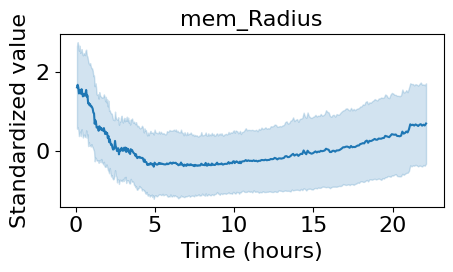

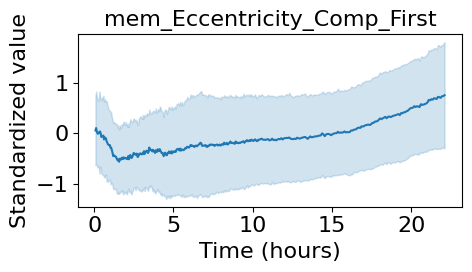

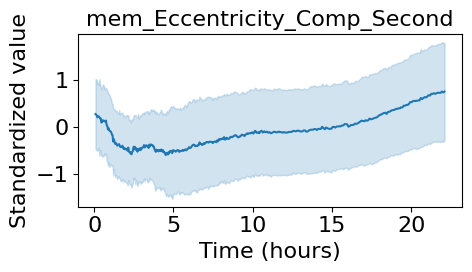

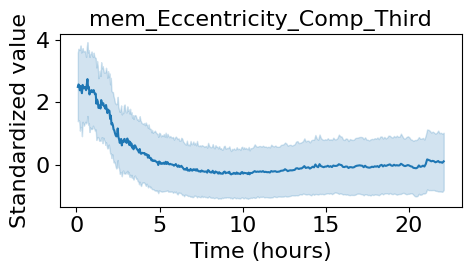

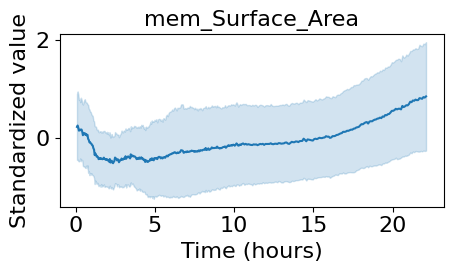

...

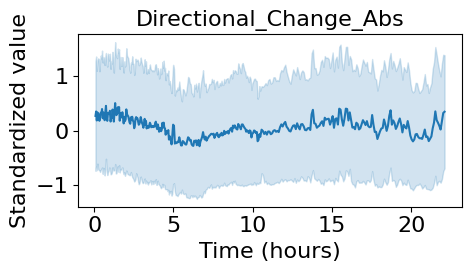

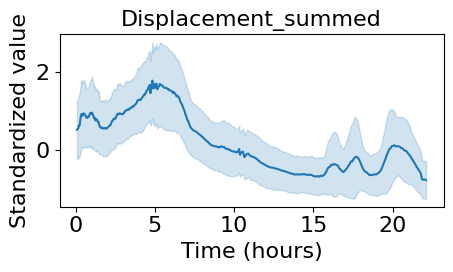

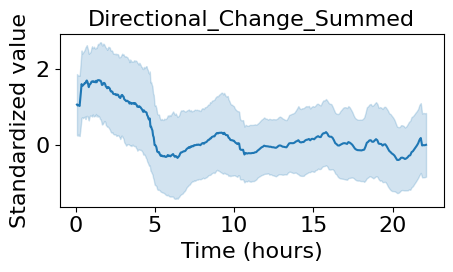

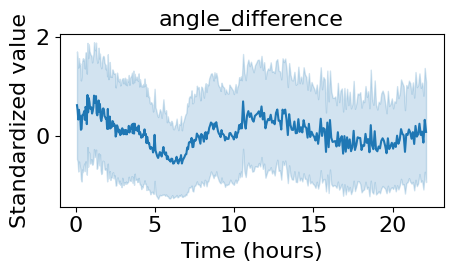

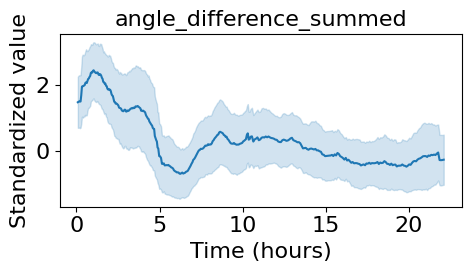

In [30]:
# Loop through selected features
for feature in ordered_features:
    plt.figure(figsize=(5, 3))
    sns.lineplot(
        data=full_df_normalized_filtered,
        x='t_hours',
        y=feature,
        errorbar='sd'  # use 'ci' for confidence interval, or 'sd' for standard deviation
    )
    plt.xlabel('Time (hours)')
    plt.ylabel('Standardized value')
    plt.title(f'{feature}')
    #plt.legend()
    plt.tight_layout()
    #plt.savefig(f'mean_feature_plots/{feature}.pdf')
    plt.show()

In [59]:
ordered_names = {'mem_Radius' : 'Membrane radius',
 'mem_Eccentricity_Comp_First' : 'Membrane major axis length', 
 'mem_Eccentricity_Comp_Second' : 'Membrane intermediate axis length',
 'mem_Eccentricity_Comp_Third' : 'Membrane minor axis length',
 'mem_Surface_Area' : 'Membrane surface area',
 'mem_Cell_Axis_Z' : 'Membrane cell axis Z',   
 'mem_2d_area' : 'Membrane center slice area',
 'mem_2d_eccentricity' : 'Membrane center slice eccentricity',
 'mem_2d_solidity' : 'Membrane center slice solidity',
 'mem_2d_extent' : 'Membrane center slice extent',
 'nuc_Radius' : 'Nucleus radius',
 'nuc_Eccentricity_Comp_First' : 'Nucleus major axis length',
 'nuc_Eccentricity_Comp_Second' : 'Nucleus intermediate axis length',   
 'nuc_Eccentricity_Comp_Third' : 'Nucleus minor axis length',
 'nuc_Cell_Axis_Z' : 'Nucleus cell axis Z',
 'mem_nuc_offset' : 'Membrane-nucleus offset',
 'POSITION_Z_norm' : 'Normalized Z position',
 'Distance_Cell_mask' : ' Distance to tissue boundary',
 'Radial_Angle_Z' : 'Radial angle Z',
 'Radial_Angle_Y' : 'Radial angle Y',
 'Radial_Angle_X' : 'Radial angle X',
 'Speed' : 'Speed',
 'Motion_Angle_Z' : 'Motion angle Z',
 'Motion_Angle_Y' : 'Motion angle Y',
 'Motion_Angle_X' : 'Motion angle X',
 'Acceleration' : 'Acceleration',
 'DISPLACEMENT_Z_ABS' : 'Z displacement',
 'DISPLACEMENT_Z_SUMMED' : 'Summed Z displacement',
 'Displacement' : 'Displacement',
 'Directional_Change_Abs' : 'Directional change',
 'Displacement_summed': 'Summed displacement',
 'Directional_Change_Summed' : 'Summed directional change',
 'angle_difference' : 'Radial divergence',
 'angle_difference_summed' : 'Summed radial divergence'}

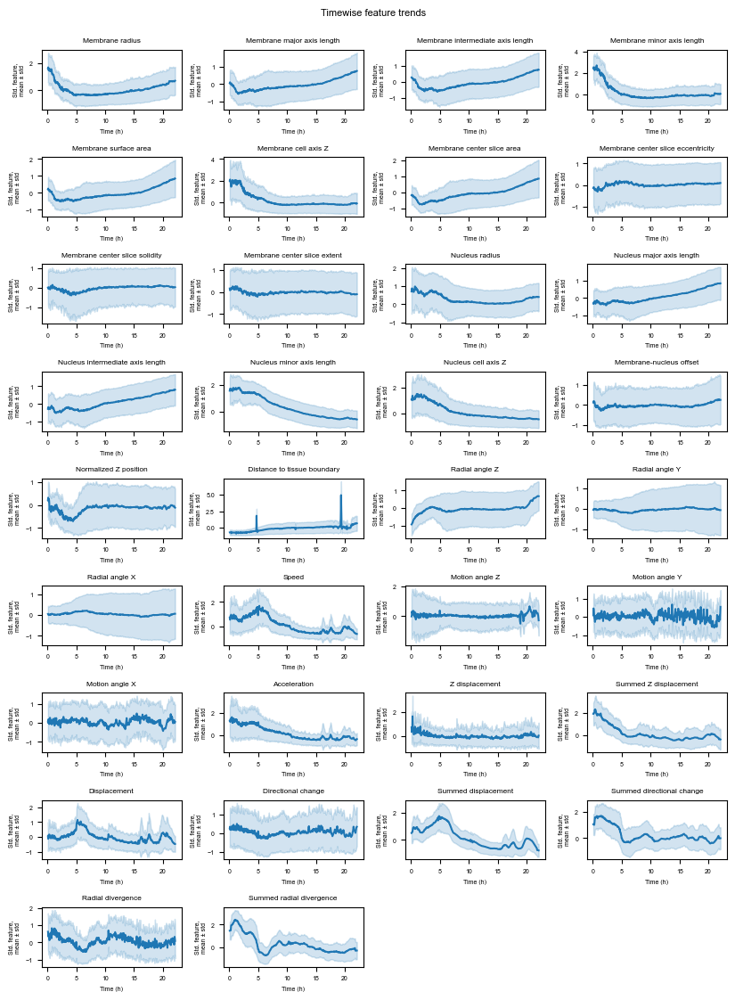

In [66]:
import math

# Set A4 figure size in inches (width x height)
a4_width, a4_height = 8.27, 11.69

# Set Arial globally
mpl.rcParams['font.family'] = 'Arial'

# Number of subplots
n_features = len(ordered_features)
n_cols = 4
n_rows = math.ceil(n_features / n_cols)

# Adjust subplot spacing based on content
fig, axes = plt.subplots(n_rows, n_cols, figsize=(a4_width, a4_height))#, constrained_layout=True)
axes = axes.flatten()

for i, feature in enumerate(ordered_features):
    ax = axes[i]
    sns.lineplot(
        data=full_df_normalized_filtered,
        x='t_hours',
        y=feature,
        errorbar='sd',
        ax=ax
    )
    ax.set_title(ordered_names[feature], fontsize=6)
    ax.set_xlabel('Time (h)', fontsize=5)
    ax.set_ylabel('Std. feature,\nmean ± std', fontsize=5)
    ax.tick_params(labelsize=5)

# Hide any unused axes
for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

fig.suptitle("Timewise feature trends", fontsize=8)

# Tighten layout manually
plt.subplots_adjust(
    left=0.05,   # Reduce left margin
    right=0.98,  # Reduce right margin
    top=0.94,    # Leave some room for title
    bottom=0.06, # Leave some room for x-labels
    hspace=0.8,  # Reduce vertical spacing
    wspace=0.3   # Reduce horizontal spacing
)

plt.savefig((f'mean_feature_plots_subplots.pdf'), bbox_inches='tight', dpi=300)
plt.show()


In [31]:
manual_df = full_df_normalized[full_df_normalized['cell_type'] != 'unknown']

In [32]:
manual_df

,Unnamed: 0,ID,Spot source ID,Track ID_x,Track ID_y,Spot frame,t,t_hours,POSITION_X,POSITION_Y,...,Directional_Change_Abs,Displacement_summed,Directional_Change_Summed,centroid_X,centroid_Y,centroid_to_cell_angle,angle_difference,angle_difference_summed,nucleus_shape_feature_distance,movement_feature_distance
132,132,26,NaN,24900.0,100,27,27.0,1.117500,847.174231,818.719776,...,-0.885861,0.403095,2.225460,736.674266,701.248898,46.751450,-1.250820,2.489318,7.815502,545.795743
133,133,27,26.0,24900.0,100,28,28.0,1.158889,849.094344,820.882957,...,-0.885861,0.403095,2.225460,737.186088,701.135452,46.938154,-1.221652,2.489318,4.109084,499.089171
134,134,29,27.0,24900.0,100,29,29.0,1.200278,850.401393,822.196195,...,-0.847943,0.403095,2.225460,737.313559,697.670752,47.755828,-1.198770,2.489318,5.088325,446.958027
135,135,31,29.0,24900.0,100,30,30.0,1.241667,851.175347,822.064758,...,-0.250978,0.403095,2.225460,742.401854,701.380903,47.971365,-0.106556,2.489318,6.618000,413.943415
136,136,33,31.0,24900.0,100,31,31.0,1.283056,849.998554,819.087862,...,0.295624,0.403095,2.225460,737.107023,698.904912,46.791836,1.894604,2.489318,7.372119,411.930748
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
746920,746920,730660,727189.0,372900.0,1960314,355,355.0,21.776389,440.002484,516.220736,...,-0.376126,-0.630778,2.581363,780.830608,763.539315,-144.033853,0.440102,-0.594561,6.742633,606.118182
746921,746921,734083,730660.0,372900.0,1960314,356,356.0,21.859444,439.384684,516.591231,...,-0.674734,-0.761450,1.930922,781.936286,763.705385,-144.193603,0.075143,-0.895188,6.522341,489.597884
746922,746922,738485,734083.0,372900.0,1960314,357,357.0,21.942500,437.857002,515.841343,...,2.625109,-0.761450,1.930922,778.139382,763.416981,-143.961886,-1.054317,-0.895188,6.351237,499.170579
746923,746923,739646,738485.0,372900.0,1960314,358,358.0,22.025556,436.001605,516.435252,...,2.778127,-0.761450,1.930922,777.780631,761.513070,-144.357013,-0.190314,-0.895188,NaN,500.443855


In [33]:
# Group by both cell_type and t_hours, and count unique Track ID_y values
group_counts = manual_df.groupby(['cell_type', 't_hours'])['Track ID_y'].nunique().reset_index()

# Keep only groups with at least 3 unique Track IDs
valid_groups = group_counts[group_counts['Track ID_y'] >= 3]

# Merge to filter the original dataframe
manual_df_filtered = manual_df.merge(valid_groups[['cell_type', 't_hours']], on=['cell_type', 't_hours'], how='inner')

# Create a mask where all selected feature values are ≤ 10
mask = (manual_df_filtered[ordered_features] <= 10).all(axis=1)

# Filter the DataFrame
manual_df_filtered2 = manual_df_filtered[mask]


In [34]:
manual_df_filtered2

,Unnamed: 0,ID,Spot source ID,Track ID_x,Track ID_y,Spot frame,t,t_hours,POSITION_X,POSITION_Y,...,Directional_Change_Abs,Displacement_summed,Directional_Change_Summed,centroid_X,centroid_Y,centroid_to_cell_angle,angle_difference,angle_difference_summed,nucleus_shape_feature_distance,movement_feature_distance
0,132,26,NaN,24900.0,100,27,27.0,1.1175,847.174231,818.719776,...,-0.885861,0.403095,2.225460,736.674266,701.248898,46.751450,-1.250820,2.489318,7.815502,545.795743
2,42016,45595,45101.0,7600.0,20700,27,27.0,1.1175,566.507654,587.456629,...,-0.413547,2.740195,2.141492,736.674266,701.248898,-146.228922,-0.652784,2.448065,4.033465,391.200894
3,43433,45401,45033.0,1700.0,21400,27,27.0,1.1175,755.233986,514.323366,...,2.138850,-0.101836,3.295443,736.674266,701.248898,-84.329722,1.759169,1.844535,4.551351,828.754939
4,44122,45578,45188.0,23500.0,21812,27,27.0,1.1175,616.896441,760.077986,...,2.404867,0.350902,0.359618,736.674266,701.248898,153.841956,-1.156503,0.866926,4.952181,934.101683
7,46538,45383,45052.0,10300.0,22800,27,27.0,1.1175,869.490885,559.238791,...,-0.596878,0.755350,2.389280,736.674266,701.248898,-46.915941,1.999609,2.682616,6.260342,627.933143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415917,327886,751943,751909.0,219900.0,369925,348,348.0,21.1950,837.941773,988.799958,...,-0.355741,-1.262587,-1.528429,780.612710,757.107888,76.102080,-1.201708,-1.793227,2.624525,396.096476
415921,493555,705656,702476.0,230313.0,564423,348,348.0,21.1950,737.593575,496.371811,...,-0.756878,0.783121,-0.308210,780.612710,757.107888,-99.368889,0.879249,1.446692,3.015910,344.800877
415922,493652,706011,702685.0,230311.0,564424,348,348.0,21.1950,691.250246,501.936603,...,-0.492393,0.693959,0.169999,780.612710,757.107888,-109.300550,0.604351,0.940209,5.221470,389.679116
415924,493800,706048,702823.0,219214.0,564426,348,348.0,21.1950,774.122555,564.894596,...,-0.559101,-0.192368,-1.353353,780.612710,757.107888,-91.933879,0.813005,1.242059,4.913740,512.786137


In [35]:
manual_df_filtered[pd.notna(manual_df_filtered[ordered_features]).all(axis=1)]

,Unnamed: 0,ID,Spot source ID,Track ID_x,Track ID_y,Spot frame,t,t_hours,POSITION_X,POSITION_Y,...,Directional_Change_Abs,Displacement_summed,Directional_Change_Summed,centroid_X,centroid_Y,centroid_to_cell_angle,angle_difference,angle_difference_summed,nucleus_shape_feature_distance,movement_feature_distance
0,132,26,NaN,24900.0,100,27,27.0,1.1175,847.174231,818.719776,...,-0.885861,0.403095,2.225460,736.674266,701.248898,46.751450,-1.250820,2.489318,7.815502,545.795743
2,42016,45595,45101.0,7600.0,20700,27,27.0,1.1175,566.507654,587.456629,...,-0.413547,2.740195,2.141492,736.674266,701.248898,-146.228922,-0.652784,2.448065,4.033465,391.200894
3,43433,45401,45033.0,1700.0,21400,27,27.0,1.1175,755.233986,514.323366,...,2.138850,-0.101836,3.295443,736.674266,701.248898,-84.329722,1.759169,1.844535,4.551351,828.754939
4,44122,45578,45188.0,23500.0,21812,27,27.0,1.1175,616.896441,760.077986,...,2.404867,0.350902,0.359618,736.674266,701.248898,153.841956,-1.156503,0.866926,4.952181,934.101683
6,46079,45493,45353.0,12100.0,22500,27,27.0,1.1175,725.402799,845.792929,...,0.747237,2.253303,1.501236,736.674266,701.248898,94.458871,1.870113,3.009433,5.537747,522.279873
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415917,327886,751943,751909.0,219900.0,369925,348,348.0,21.1950,837.941773,988.799958,...,-0.355741,-1.262587,-1.528429,780.612710,757.107888,76.102080,-1.201708,-1.793227,2.624525,396.096476
415921,493555,705656,702476.0,230313.0,564423,348,348.0,21.1950,737.593575,496.371811,...,-0.756878,0.783121,-0.308210,780.612710,757.107888,-99.368889,0.879249,1.446692,3.015910,344.800877
415922,493652,706011,702685.0,230311.0,564424,348,348.0,21.1950,691.250246,501.936603,...,-0.492393,0.693959,0.169999,780.612710,757.107888,-109.300550,0.604351,0.940209,5.221470,389.679116
415924,493800,706048,702823.0,219214.0,564426,348,348.0,21.1950,774.122555,564.894596,...,-0.559101,-0.192368,-1.353353,780.612710,757.107888,-91.933879,0.813005,1.242059,4.913740,512.786137


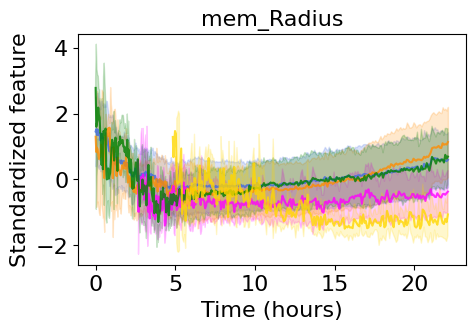

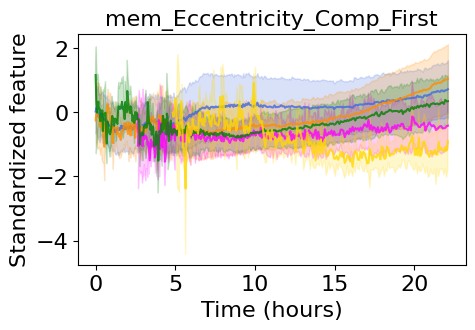

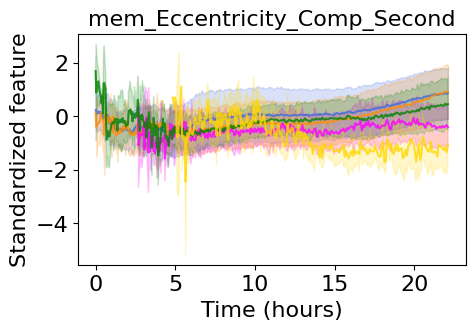

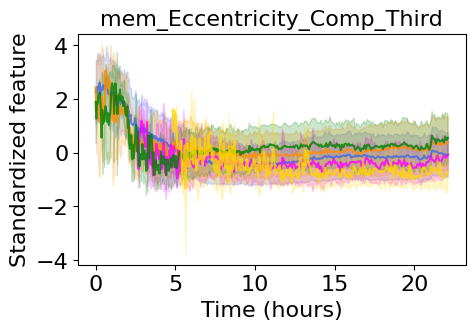

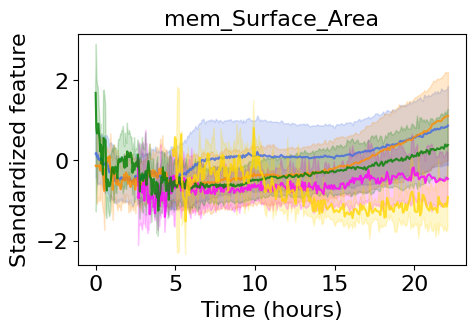

...

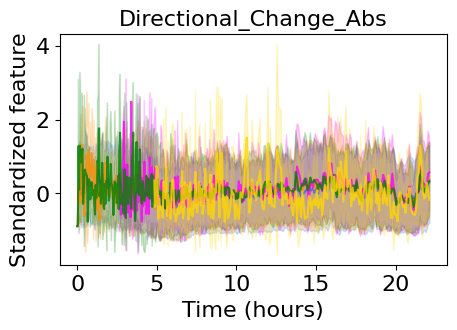

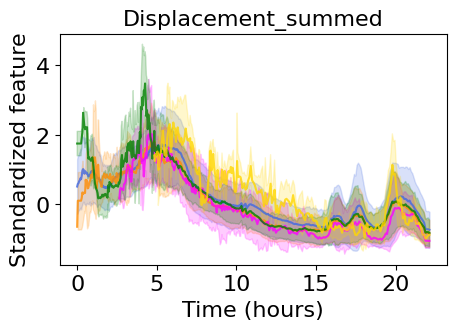

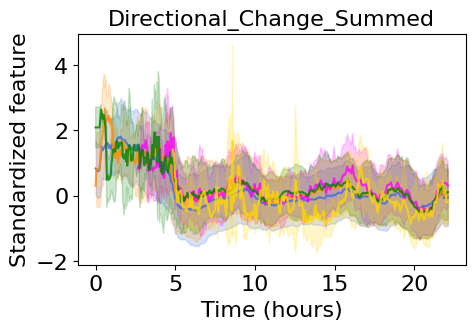

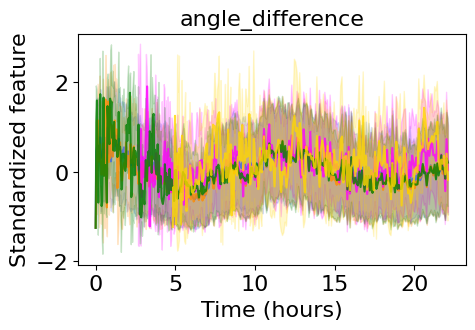

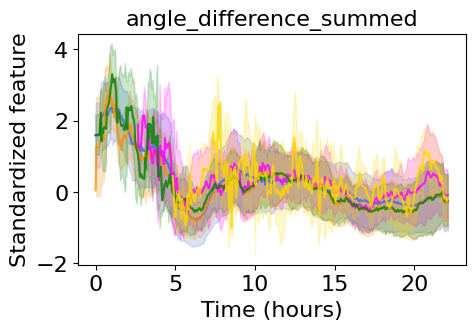

In [36]:
# Ensure 't_hours' is sorted correctly
manual_df_filtered2 = manual_df_filtered2.sort_values(['cell_type', 't_hours'])

# Define a custom color dictionary for cell types
custom_colors = {
    'basal': 'royalblue',  
    'goblet': 'darkorange',  
    'ic': 'magenta',  
    'mcc': 'green',
    'ssc' : 'gold'   
}

for feature in ordered_features:
    # Create the line plot
    plt.figure(figsize=(5, 3))
    sns.lineplot(
        data=manual_df_filtered2,
        x='t_hours', 
        y=feature, 
        hue='cell_type',  # Different colors for each cell type
        palette=custom_colors,
        estimator='mean',  # Averaging Z_norm for each (cell_type, t_hours)
        errorbar='sd',
        alpha=0.8
    )

    # Customize labels and title
    plt.xlabel('Time (hours)')
    plt.ylabel('Standardized feature')
    plt.title(f'{feature}')
    plt.legend().remove()
    plt.grid(False)
    #plt.savefig(f'celltype_mean_feature_plots/celltype_mean_{feature}.pdf')
    plt.show()

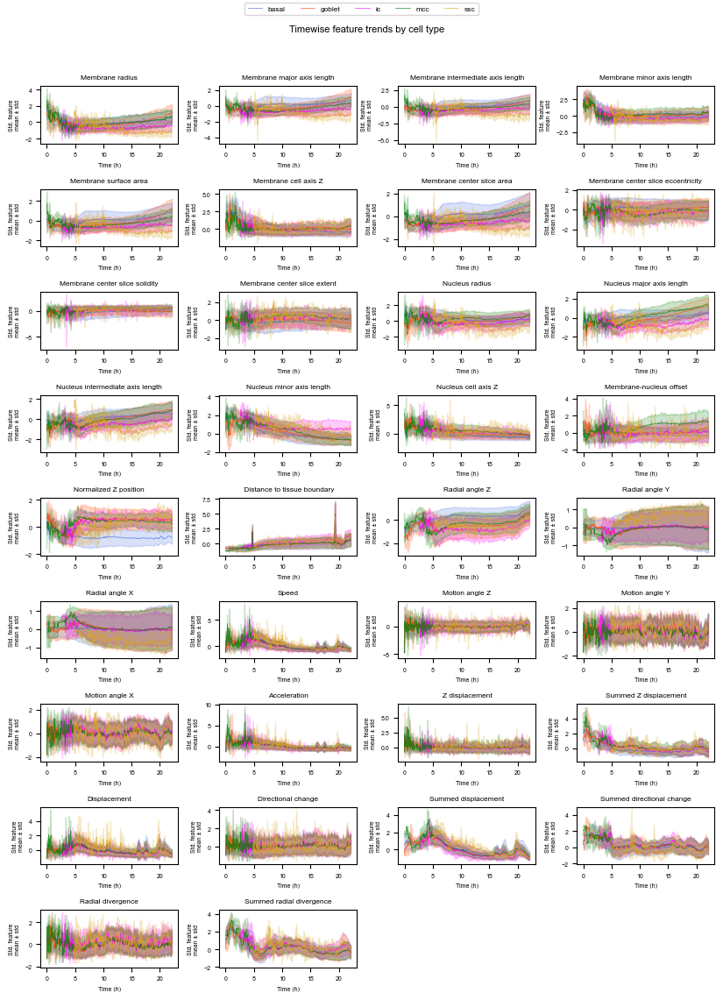

In [67]:
# Ensure data is sorted
manual_df_filtered2 = manual_df_filtered2.sort_values(['cell_type', 't_hours'])

# A4 size in inches
a4_width, a4_height = 8.27, 11.69

# Grid layout
n_features = len(ordered_features)
n_cols = 4  # fewer columns for better space if legend is added
n_rows = math.ceil(n_features / n_cols)

# Color map for cell types
custom_colors = {
    'basal': 'royalblue',  
    'goblet': 'orangered',  
    'ic': 'magenta',  
    'mcc': 'green',
    'ssc': 'goldenrod'
}

# Create figure and axes
fig, axes = plt.subplots(n_rows, n_cols, figsize=(a4_width, a4_height))
axes = axes.flatten()

for i, feature in enumerate(ordered_features):
    ax = axes[i]
    sns.lineplot(
        data=manual_df_filtered2,
        x='t_hours',
        y=feature,
        hue='cell_type',
        palette=custom_colors,
        estimator='mean',
        errorbar='sd',
        linewidth=0.6,
        alpha=0.7,
        ax=ax
    )
    ax.set_title(ordered_names[feature], fontsize=6)
    ax.set_xlabel('Time (h)', fontsize=5)
    ax.set_ylabel('Std. feature\nmean ± std', fontsize=5)
    ax.tick_params(labelsize=5)
    ax.legend().remove()
    ax.grid(False)

# Hide extra axes
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

# Add a shared legend outside the plot
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=len(custom_colors), fontsize=6)

# Adjust layout
plt.subplots_adjust(
    left=0.05,
    right=0.98,
    top=0.92,
    bottom=0.06,
    hspace=0.8,
    wspace=0.3
)

fig.suptitle("Timewise feature trends by cell type", fontsize=8)
plt.savefig((f'mean_feature_plots_subplots_celltypes.pdf'), bbox_inches='tight', dpi=300)
plt.show()

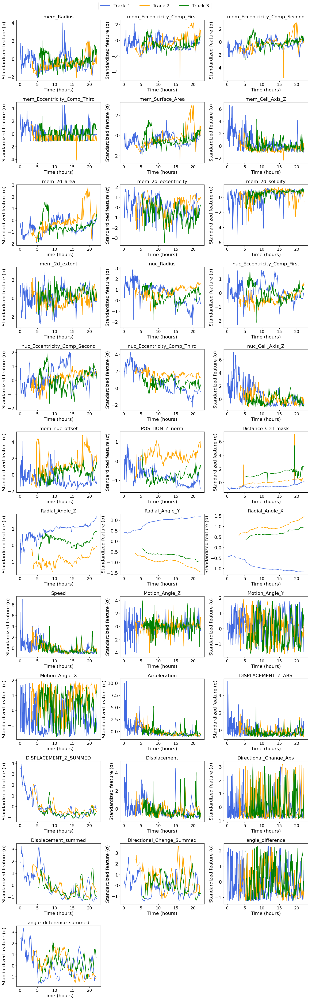

In [168]:
from matplotlib.lines import Line2D

# Subset and sort data
df_selected = full_df_normalized_cropped[
    full_df_normalized_cropped['Track ID_y'].isin(random_choices_tracklets)
]
df_selected = df_selected.sort_values(['Spot track ID relabelled', 't_hours']).reset_index(drop=True)

# Define grid
num_features = len(ordered_features)
num_cols = 3
num_rows = (num_features + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 4), sharex=False)
axes = axes.flatten()

# Define color and label mappings
track_ids = sorted(df_selected['Spot track ID relabelled'].unique())
custom_labels = ['Track 1', 'Track 2', 'Track 3']
custom_colors = ['royalblue', 'orange', 'green']
label_map = dict(zip(track_ids, custom_labels))
color_map = dict(zip(track_ids, custom_colors))

# Plot each feature
for i, feature in enumerate(ordered_features):
    ax = axes[i]
    sns.lineplot(
        data=df_selected,
        x='t_hours', y=feature,
        hue='Spot track ID relabelled',
        ax=ax,
        palette=color_map,
        legend=False
    )

    ax.set_title(f'{feature}')
    ax.set_xlabel('Time (hours)')
    ax.set_ylabel('Standardized feature (σ)')

    # Show x-tick labels explicitly
    ax.tick_params(axis='x', labelsize=14)

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Manually create legend
legend_elements = [
    Line2D([0], [0], color=color_map[tid], lw=2, label=label_map[tid])
    for tid in track_ids
]

fig.legend(
    handles=legend_elements,
    loc='upper center',
    bbox_to_anchor=(0.5, 0.99),
    ncol=len(track_ids),
    fontsize=16
)

plt.tight_layout(rect=[0, 0, 1, 0.98])  # Make space for legend
#plt.savefig('FigS2.pdf')
plt.show()

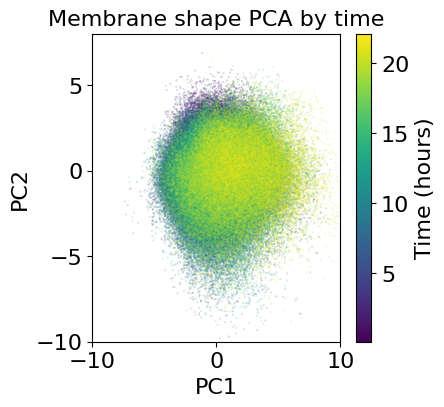

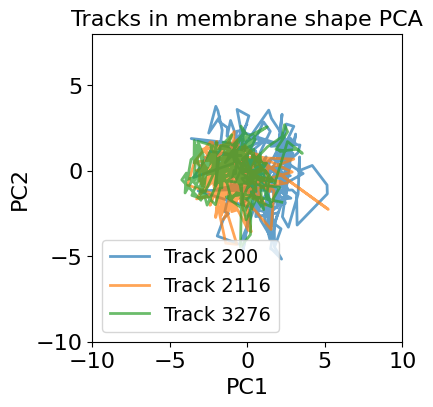

c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


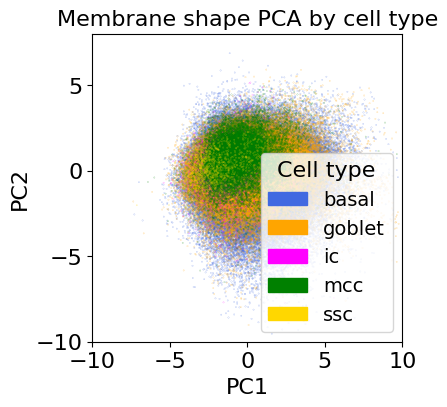

In [96]:
# Fit and transform PCA
pca = PCA(n_components=2)
mem_shape_pca_result = pca.fit_transform(full_df_normalized_cropped2[[feature for feature in ordered_features if feature in feature_categories['membrane_shape']]])  # Drop categorical column

# Convert PCA results to DataFrame
pca_df = pd.DataFrame(mem_shape_pca_result, columns=['PC1', 'PC2'])

pca_df['t_hours'] = full_df_normalized_cropped['t_hours'].values
pca_df['Spot track ID relabelled'] = full_df_normalized_cropped['Spot track ID relabelled'].values
pca_df['cell_type'] = full_df_normalized_cropped['cell_type'].values

pca_df_selected_annotated = pca_df[(pca_df['cell_type'] != 'unknown')]

pca_df_selected_annotated = pca_df_selected_annotated.sort_values(['cell_type', 't_hours']).reset_index(drop=True)

pca_df_selected = pca_df[(pca_df['Spot track ID relabelled'].isin(random_choices))]

pca_df_selected = pca_df_selected.sort_values(['Spot track ID relabelled', 't_hours']).reset_index(drop=True)

plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df['PC1'], pca_df['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df['t_hours'],  # Color by time
    cmap='viridis',
    rasterized = True
)

plt.colorbar(label='Time (hours)')  # Add color legend for time
plt.title('Membrane shape PCA by time')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-10,10))
plt.ylim((-10,8))
#plt.savefig('plots_15_03/mem_shape_PCA.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

plt.figure(figsize=(4, 4))

for track_id, group in pca_df_selected.groupby('Spot track ID relabelled'):  
    plt.plot(group["PC1"], group["PC2"], label=f'Track {track_id}', linewidth=2, alpha=0.7)

plt.title('Tracks in membrane shape PCA')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-10,10))
plt.ylim((-10,8))
plt.legend()
#plt.savefig('plots_15_03/mem_shape_PCA_tracks.pdf')
plt.show()

# Define color mapping for cell types
cell_type_colors = {'basal': 'royalblue', 'goblet': 'orange', 'ic': 'magenta', 'mcc': 'green', 'ssc': 'gold'}

plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df_selected_annotated['PC1'], pca_df_selected_annotated['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df_selected_annotated['cell_type'].map(cell_type_colors),  # Color by cell type
    rasterized = True
)

# Create legend handles
legend_patches = [mpatches.Patch(color=color, label=ctype) for ctype, color in cell_type_colors.items()]
plt.legend(handles=legend_patches, title="Cell type", frameon=True)

plt.title('Membrane shape PCA by cell type')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-10,10))
plt.ylim((-10,8))
#plt.savefig('plots_15_03/mem_shape_PCA_celltypes.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()


In [97]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans

In [98]:
def knn_error(X, y, k=5):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X, y.ravel())
    return 1 - knn.score(X, y.ravel())

def kmeans_ari(X, y, n_clusters=None):
    if n_clusters is None:
        n_clusters = len(np.unique(y))
    km = KMeans(n_clusters=n_clusters, random_state=0)
    labels = km.fit_predict(X)
    return adjusted_rand_score(y.ravel(), labels)

def kmeans_nmi(X, y, n_clusters=None):
    if n_clusters is None:
        n_clusters = len(np.unique(y))
    km = KMeans(n_clusters=n_clusters, random_state=0)
    labels = km.fit_predict(X)
    return normalized_mutual_info_score(y.ravel(), labels)

def calc_asw(X, y):
    return silhouette_score(X, y.ravel())

  0%|          | 0/358 [00:00<?, ?it/s]

100%|██████████| 358/358 [01:22<00:00,  4.33it/s]


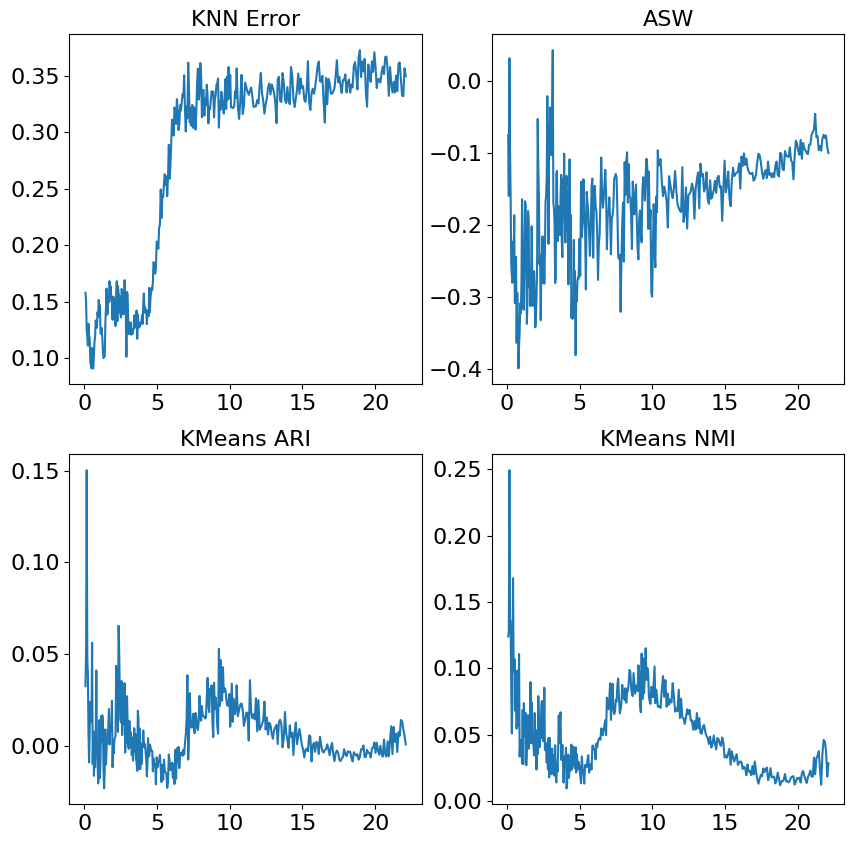

In [99]:
from sklearn.preprocessing import StandardScaler
#from metrics import knn_error, kmeans_nmi, kmeans_ari, calc_asw
from tqdm import tqdm

metrics = []

for t in tqdm(pca_df_selected_annotated['t_hours'].unique()):
    cur_df = pca_df_selected_annotated[pca_df_selected_annotated['t_hours'] == t]
    
    X = StandardScaler().fit_transform(cur_df[['PC1', 'PC2']].to_numpy())[:]
    y = cur_df['cell_type'].astype('category').cat.codes.to_numpy().reshape(-1,1).astype(np.float32)

    metrics.append([knn_error(X,y), kmeans_ari(X,y), kmeans_nmi(X,y), calc_asw(X,y)])


met_membrane = np.array(metrics)

fig, ax = plt.subplots(2,2, figsize=(10,10))

ax[0][0].plot(pca_df_selected_annotated['t_hours'].unique(), met_membrane[:,0])
ax[0][0].set_title('KNN Error')

ax[0][1].plot(pca_df_selected_annotated['t_hours'].unique(), met_membrane[:,3])
ax[0][1].set_title('ASW')

ax[1][0].plot(pca_df_selected_annotated['t_hours'].unique(), met_membrane[:,1])
ax[1][0].set_title('KMeans ARI')

ax[1][1].plot(pca_df_selected_annotated['t_hours'].unique(), met_membrane[:,2])
ax[1][1].set_title('KMeans NMI')

#ax[0][0].set_ylim(0,1)
#ax[0][1].set_ylim(-1,1)
#ax[1][0].set_ylim(0,0.2)
#ax[1][1].set_ylim(0,0.2)


#plt.savefig('membrane_pca_sep_metrics.pdf')

plt.show()

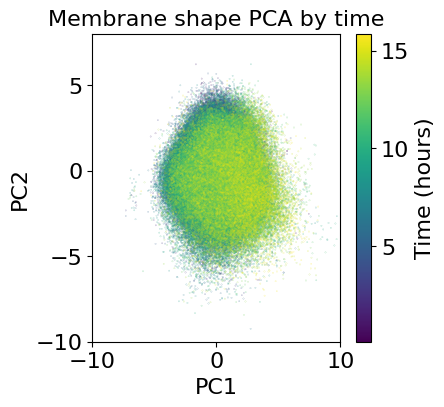

In [83]:
# Fit and transform PCA
pca = PCA(n_components=2)
mem_shape_pca_result_seconddataset = pca.fit_transform(full_df_normalized_cropped2_seconddataset[[feature for feature in ordered_features if feature in feature_categories['membrane_shape']]])  # Drop categorical column

# Convert PCA results to DataFrame
pca_df_seconddataset = pd.DataFrame(mem_shape_pca_result_seconddataset, columns=['PC1', 'PC2'])

pca_df_seconddataset['t_hours'] = full_df_normalized_cropped_seconddataset['t_hours'].values
pca_df_seconddataset['Spot track ID relabelled'] = full_df_normalized_cropped_seconddataset['Spot track ID relabelled'].values
pca_df_seconddataset['cell_type'] = full_df_normalized_cropped_seconddataset['cell_type'].values

plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df_seconddataset['PC1'], pca_df_seconddataset['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df_seconddataset['t_hours'],  # Color by time
    cmap='viridis',
    rasterized = True
)

plt.colorbar(label='Time (hours)')  # Add color legend for time
plt.title('Membrane shape PCA by time')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-10,10))
plt.ylim((-10,8))
plt.savefig('plots_15_03/mem_shape_PCA_seconddataset.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()


In [ ]:
mem_shape_features = [feature for feature in ordered_features if feature in feature_categories['membrane_shape']]

# Combine the original data and the PCA results
combined_df = pd.concat([full_df_normalized_cropped2.reset_index(drop=True), pca_df], axis=1)

# Compute correlation matrix
correlation_with_pcs = combined_df.corr(method='spearman').loc[mem_shape_features, ['PC1', 'PC2']]

# Sort by absolute correlation with PC1
correlation_sorted_membrane = correlation_with_pcs.reindex(
    correlation_with_pcs['PC1'].abs().sort_values(ascending=False).index
)

C:\Users\ghr283\AppData\Local\Temp\ipykernel_16936\2742442443.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_with_pcs = combined_df.corr(method='spearman').loc[mem_shape_features, ['PC1', 'PC2']]


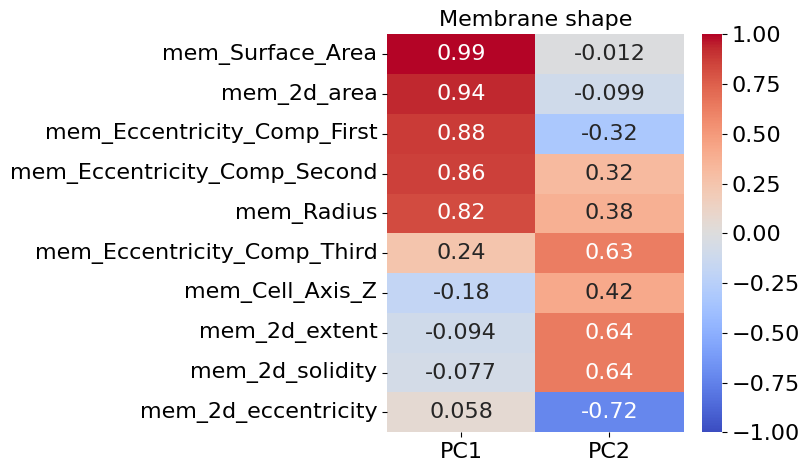

In [95]:
plt.figure(figsize=(8, len(mem_shape_features) * 0.5))
sns.heatmap(
    correlation_sorted_membrane,
    annot=True,
    cmap='coolwarm',
    center=0,
    vmin=-1,     # Minimum value on the color scale
    vmax=1       # Maximum value on the color scale
)
plt.title('Membrane shape')
plt.tight_layout()
plt.savefig('plots_15_03/mem_shape_PCA_featurecorrelation.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()


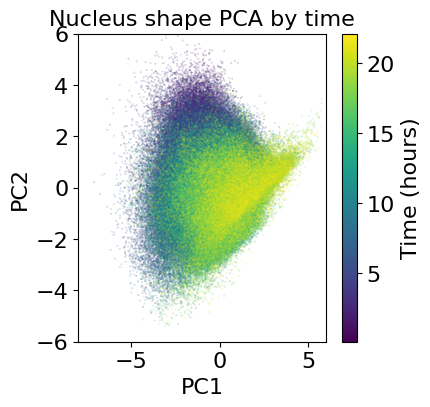

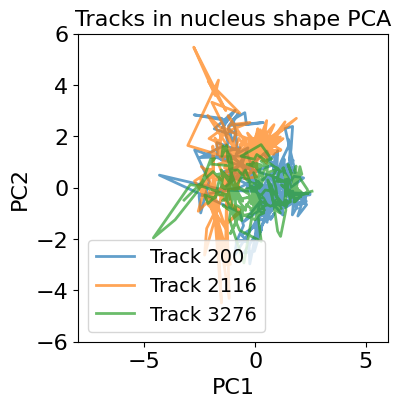

c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


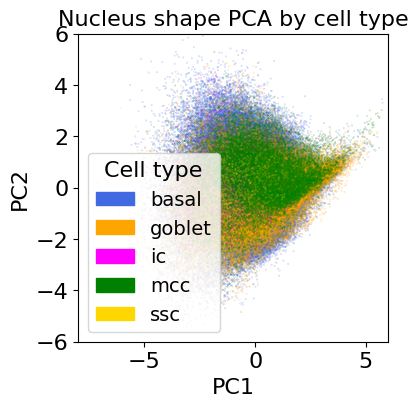

In [100]:
# Fit and transform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(full_df_normalized_cropped2[[feature for feature in ordered_features if feature in feature_categories['nucleus_shape']]])  # Drop categorical column

# Convert PCA results to DataFrame
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])

pca_df['t_hours'] = full_df_normalized_cropped['t_hours'].values
pca_df['Spot track ID relabelled'] = full_df_normalized_cropped['Spot track ID relabelled'].values
pca_df['cell_type'] = full_df_normalized_cropped['cell_type'].values

pca_df_selected_annotated = pca_df[(pca_df['cell_type'] != 'unknown')]

pca_df_selected_annotated = pca_df_selected_annotated.sort_values(['cell_type', 't_hours']).reset_index(drop=True)

pca_df_selected = pca_df[(pca_df['Spot track ID relabelled'].isin(random_choices))]

pca_df_selected = pca_df_selected.sort_values(['Spot track ID relabelled', 't_hours']).reset_index(drop=True)

plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df['PC1'], pca_df['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df['t_hours'],  # Color by time
    cmap='viridis',
    rasterized = True
)

plt.colorbar(label='Time (hours)')  # Add color legend for time
plt.title('Nucleus shape PCA by time')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-8,6))
plt.ylim((-6,6))
#plt.savefig('plots_15_03/nuc_shape_PCA.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

plt.figure(figsize=(4, 4))

for track_id, group in pca_df_selected.groupby('Spot track ID relabelled'):  
    plt.plot(group["PC1"], group["PC2"], label=f'Track {track_id}', linewidth=2, alpha=0.7)

plt.title('Tracks in nucleus shape PCA')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-8,6))
plt.ylim((-6,6))
plt.legend()
#plt.savefig('plots_15_03/nuc_shape_PCA_tracks.pdf')
plt.show()

# Define color mapping for cell types
cell_type_colors = {'basal': 'royalblue', 'goblet': 'orange', 'ic': 'magenta', 'mcc': 'green', 'ssc': 'gold'}

plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df_selected_annotated['PC1'], pca_df_selected_annotated['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df_selected_annotated['cell_type'].map(cell_type_colors),  # Color by cell type
    rasterized = True
)

# Create legend handles
legend_patches = [mpatches.Patch(color=color, label=ctype) for ctype, color in cell_type_colors.items()]
plt.legend(handles=legend_patches, title="Cell type", frameon=True)

plt.title('Nucleus shape PCA by cell type')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-8,6))
plt.ylim((-6,6))
#plt.savefig('plots_15_03/nuc_shape_PCA_celltypes.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

100%|██████████| 358/358 [01:21<00:00,  4.38it/s]


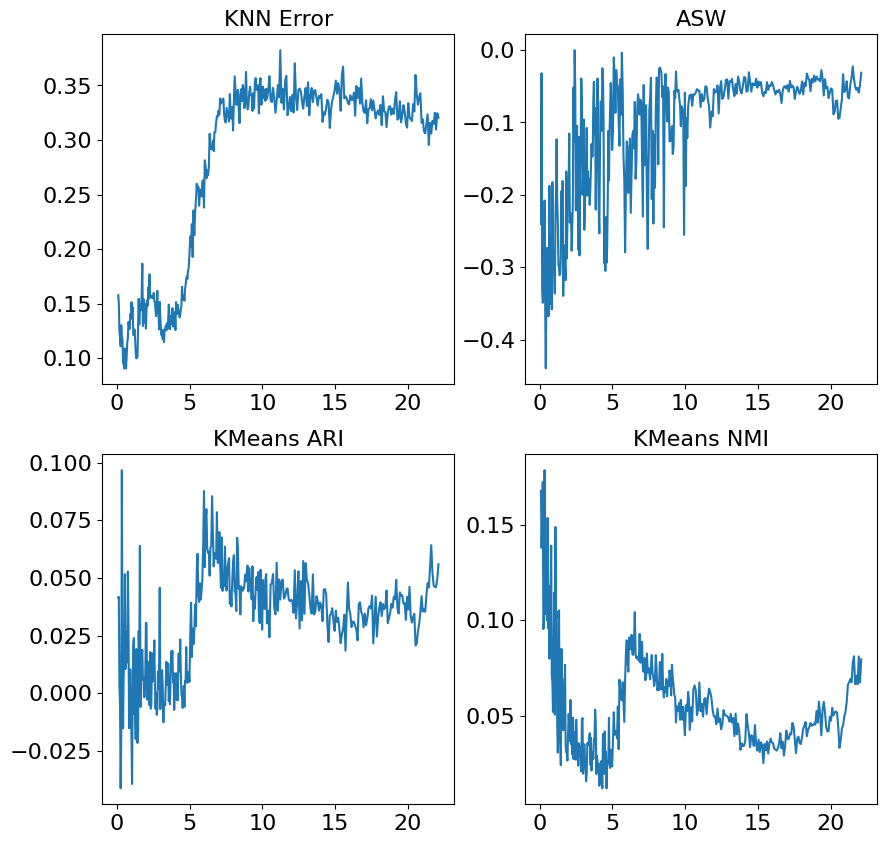

In [101]:
metrics = []

for t in tqdm(pca_df_selected_annotated['t_hours'].unique()):
    cur_df = pca_df_selected_annotated[pca_df_selected_annotated['t_hours'] == t]
    
    X = StandardScaler().fit_transform(cur_df[['PC1', 'PC2']].to_numpy())[:]
    y = cur_df['cell_type'].astype('category').cat.codes.to_numpy().reshape(-1,1).astype(np.float32)

    metrics.append([knn_error(X,y), kmeans_ari(X,y), kmeans_nmi(X,y), calc_asw(X,y)])


met_nucleus = np.array(metrics)

fig, ax = plt.subplots(2,2, figsize=(10,10))

ax[0][0].plot(pca_df_selected_annotated['t_hours'].unique(), met_nucleus[:,0])
ax[0][0].set_title('KNN Error')

ax[0][1].plot(pca_df_selected_annotated['t_hours'].unique(), met_nucleus[:,3])
ax[0][1].set_title('ASW')

ax[1][0].plot(pca_df_selected_annotated['t_hours'].unique(), met_nucleus[:,1])
ax[1][0].set_title('KMeans ARI')

ax[1][1].plot(pca_df_selected_annotated['t_hours'].unique(), met_nucleus[:,2])
ax[1][1].set_title('KMeans NMI')

#ax[0][0].set_ylim(0,1)
#ax[0][1].set_ylim(-1,1)
#ax[1][0].set_ylim(0,0.2)
#ax[1][1].set_ylim(0,0.2)


#plt.savefig('nucleus_pca_sep_metrics.pdf')

plt.show()

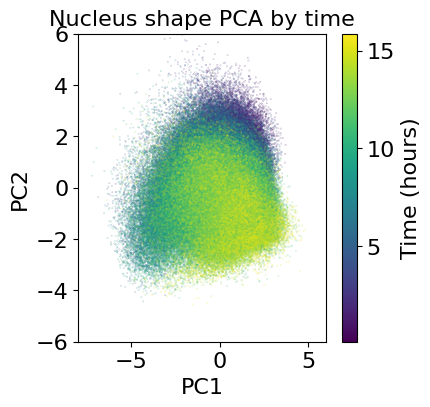

In [84]:
# Fit and transform PCA
pca = PCA(n_components=2)
pca_result_seconddataset = pca.fit_transform(full_df_normalized_cropped2_seconddataset[[feature for feature in ordered_features if feature in feature_categories['nucleus_shape']]])  # Drop categorical column

# Convert PCA results to DataFrame
pca_df_seconddataset = pd.DataFrame(pca_result_seconddataset, columns=['PC1', 'PC2'])

pca_df_seconddataset['t_hours'] = full_df_normalized_cropped_seconddataset['t_hours'].values
pca_df_seconddataset['Spot track ID relabelled'] = full_df_normalized_cropped_seconddataset['Spot track ID relabelled'].values
pca_df_seconddataset['cell_type'] = full_df_normalized_cropped_seconddataset['cell_type'].values

plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df_seconddataset['PC1'], pca_df_seconddataset['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df_seconddataset['t_hours'],  # Color by time
    cmap='viridis',
    rasterized = True
)

plt.colorbar(label='Time (hours)')  # Add color legend for time
plt.title('Nucleus shape PCA by time')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-8,6))
plt.ylim((-6,6))
plt.savefig('plots_15_03/nuc_shape_PCA_seconddataset.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()


In [ ]:
nuc_shape_features = [feature for feature in ordered_features if feature in feature_categories['nucleus_shape']]

# Combine the original data and the PCA results
combined_df = pd.concat([full_df_normalized_cropped2.reset_index(drop=True), pca_df], axis=1)

# Compute correlation matrix
correlation_with_pcs = combined_df.corr(method='spearman').loc[nuc_shape_features, ['PC1', 'PC2']]

# Sort by absolute correlation with PC1
correlation_sorted_nucleus = correlation_with_pcs.reindex(
    correlation_with_pcs['PC1'].abs().sort_values(ascending=False).index
)

C:\Users\ghr283\AppData\Local\Temp\ipykernel_16936\553162063.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_with_pcs = combined_df.corr(method='spearman').loc[nuc_shape_features, ['PC1', 'PC2']]


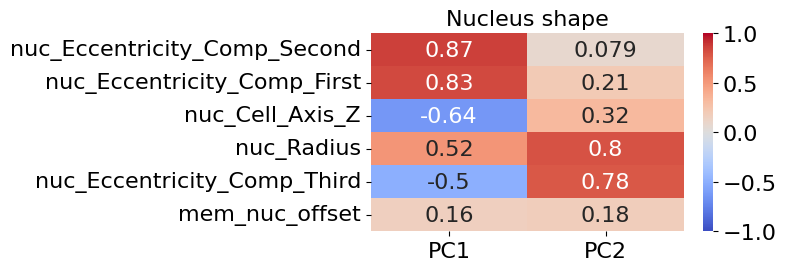

In [98]:
plt.figure(figsize=(8, len(nuc_shape_features) * 0.5))
sns.heatmap(
    correlation_sorted_nucleus,
    annot=True,
    cmap='coolwarm',
    center=0,
    vmin=-1,     # Minimum value on the color scale
    vmax=1       # Maximum value on the color scale
)
plt.title('Nucleus shape')
plt.tight_layout()
plt.savefig('plots_15_03/nuc_shape_PCA_featurecorrelation.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()


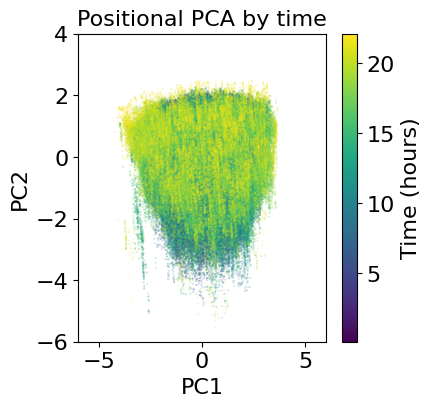

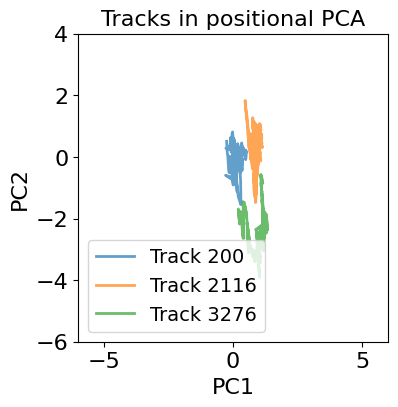

c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


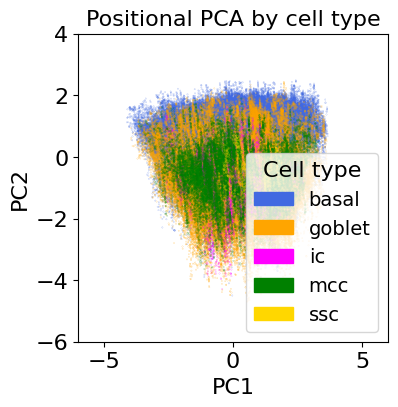

In [102]:
# Fit and transform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(full_df_normalized_cropped2[[feature for feature in ordered_features if feature in feature_categories['position']]])  # Drop categorical column

# Convert PCA results to DataFrame
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])

pca_df['t_hours'] = full_df_normalized_cropped['t_hours'].values
pca_df['Spot track ID relabelled'] = full_df_normalized_cropped['Spot track ID relabelled'].values
pca_df['cell_type'] = full_df_normalized_cropped['cell_type'].values

pca_df_selected_annotated = pca_df[(pca_df['cell_type'] != 'unknown')]

pca_df_selected_annotated = pca_df_selected_annotated.sort_values(['cell_type', 't_hours']).reset_index(drop=True)

pca_df_selected = pca_df[(pca_df['Spot track ID relabelled'].isin(random_choices))]

pca_df_selected = pca_df_selected.sort_values(['Spot track ID relabelled', 't_hours']).reset_index(drop=True)

plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df['PC1'], pca_df['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df['t_hours'],  # Color by time
    cmap='viridis',
    rasterized = True
)

plt.colorbar(label='Time (hours)')  # Add color legend for time
plt.title('Positional PCA by time')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-6,6))
plt.ylim((-6,4))
#plt.savefig('plots_15_03/position_PCA.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

plt.figure(figsize=(4, 4))

for track_id, group in pca_df_selected.groupby('Spot track ID relabelled'):  
    plt.plot(group["PC1"], group["PC2"], label=f'Track {track_id}', linewidth=2, alpha=0.7)
    
plt.title('Tracks in positional PCA')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-6,6))
plt.ylim((-6,4))
plt.legend()
#plt.savefig('plots_15_03/position_PCA_tracks.pdf')
plt.show()

# Define color mapping for cell types
cell_type_colors = {'basal': 'royalblue', 'goblet': 'orange', 'ic': 'magenta', 'mcc': 'green', 'ssc': 'gold'}

plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df_selected_annotated['PC1'], pca_df_selected_annotated['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df_selected_annotated['cell_type'].map(cell_type_colors),  # Color by cell type
    rasterized = True
)

# Create legend handles
legend_patches = [mpatches.Patch(color=color, label=ctype) for ctype, color in cell_type_colors.items()]
plt.legend(handles=legend_patches, title="Cell type", frameon=True)

plt.title('Positional PCA by cell type')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-6,6))
plt.ylim((-6,4))
#plt.savefig('plots_15_03/position_PCA_celltypes.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

100%|██████████| 358/358 [01:20<00:00,  4.47it/s]


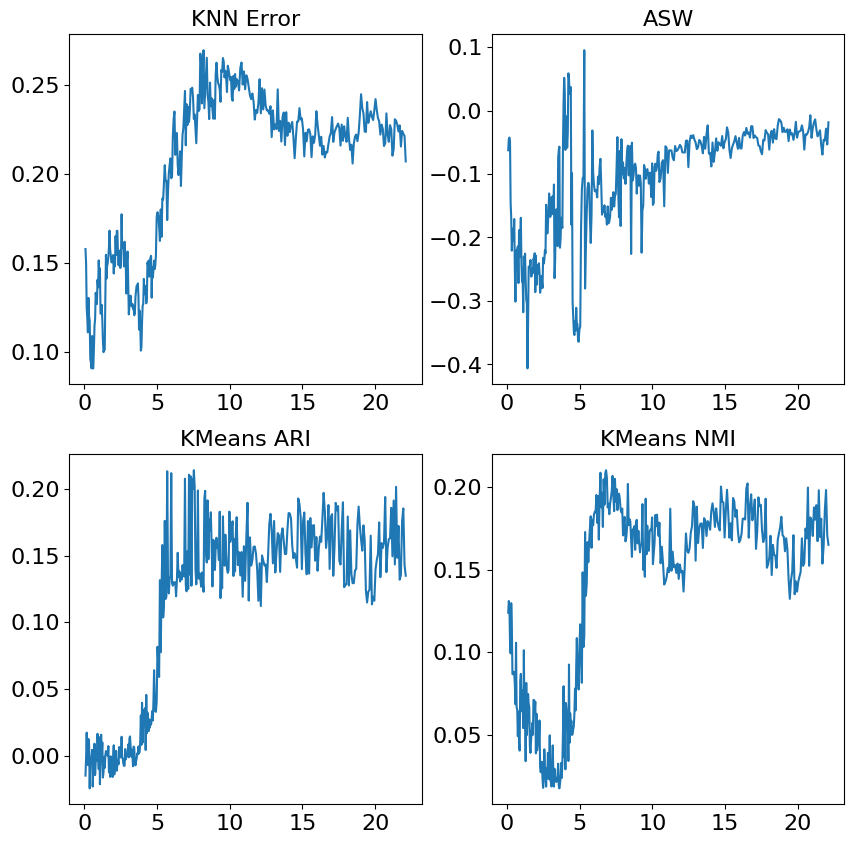

In [103]:
metrics = []

for t in tqdm(pca_df_selected_annotated['t_hours'].unique()):
    cur_df = pca_df_selected_annotated[pca_df_selected_annotated['t_hours'] == t]
    
    X = StandardScaler().fit_transform(cur_df[['PC1', 'PC2']].to_numpy())[:]
    y = cur_df['cell_type'].astype('category').cat.codes.to_numpy().reshape(-1,1).astype(np.float32)

    metrics.append([knn_error(X,y), kmeans_ari(X,y), kmeans_nmi(X,y), calc_asw(X,y)])


met_position = np.array(metrics)

fig, ax = plt.subplots(2,2, figsize=(10,10))

ax[0][0].plot(pca_df_selected_annotated['t_hours'].unique(), met_position[:,0])
ax[0][0].set_title('KNN Error')

ax[0][1].plot(pca_df_selected_annotated['t_hours'].unique(), met_position[:,3])
ax[0][1].set_title('ASW')

ax[1][0].plot(pca_df_selected_annotated['t_hours'].unique(), met_position[:,1])
ax[1][0].set_title('KMeans ARI')

ax[1][1].plot(pca_df_selected_annotated['t_hours'].unique(), met_position[:,2])
ax[1][1].set_title('KMeans NMI')

#ax[0][0].set_ylim(0,1)
#ax[0][1].set_ylim(-1,1)
#ax[1][0].set_ylim(0,0.2)
#ax[1][1].set_ylim(0,0.2)


#plt.savefig('position_pca_sep_metrics.pdf')

plt.show()

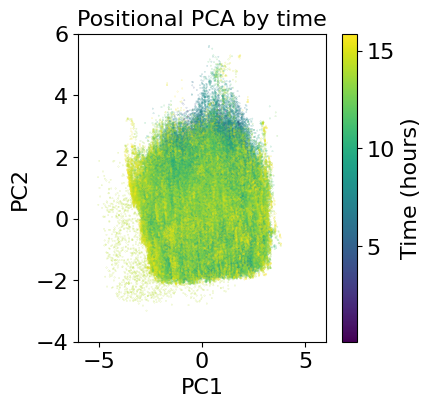

In [86]:
# Fit and transform PCA
pca = PCA(n_components=2)
pca_result_seconddataset = pca.fit_transform(full_df_normalized_cropped2_seconddataset[[feature for feature in ordered_features if feature in feature_categories['position']]])  # Drop categorical column

# Convert PCA results to DataFrame
pca_df_seconddataset = pd.DataFrame(pca_result_seconddataset, columns=['PC1', 'PC2'])

pca_df_seconddataset['t_hours'] = full_df_normalized_cropped_seconddataset['t_hours'].values
pca_df_seconddataset['Spot track ID relabelled'] = full_df_normalized_cropped_seconddataset['Spot track ID relabelled'].values
pca_df_seconddataset['cell_type'] = full_df_normalized_cropped_seconddataset['cell_type'].values


plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df_seconddataset['PC1'], pca_df_seconddataset['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df_seconddataset['t_hours'],  # Color by time
    cmap='viridis',
    rasterized = True
)

plt.colorbar(label='Time (hours)')  # Add color legend for time
plt.title('Positional PCA by time')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-6,6))
plt.ylim((-4,6))
plt.savefig('plots_15_03/position_PCA_seconddataset.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
pos_shape_features = [feature for feature in ordered_features if feature in feature_categories['position']]

# Combine the original data and the PCA results
combined_df = pd.concat([full_df_normalized_cropped2.reset_index(drop=True), pca_df], axis=1)

# Compute correlation matrix
correlation_with_pcs = combined_df.corr(method='spearman').loc[pos_shape_features, ['PC1', 'PC2']]

# Sort by absolute correlation with PC1
correlation_sorted_position = correlation_with_pcs.reindex(
    correlation_with_pcs['PC1'].abs().sort_values(ascending=False).index
)

C:\Users\ghr283\AppData\Local\Temp\ipykernel_16936\2347281359.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_with_pcs = combined_df.corr(method='spearman').loc[pos_shape_features, ['PC1', 'PC2']]


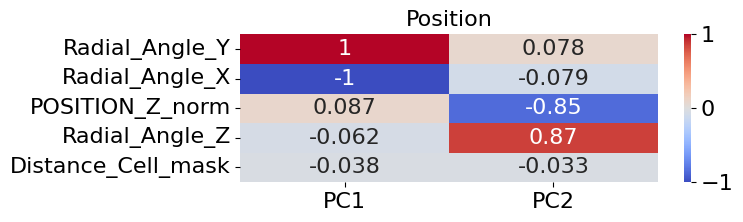

In [101]:
plt.figure(figsize=(8, len(pos_shape_features) * 0.5))
sns.heatmap(
    correlation_sorted_position,
    annot=True,
    cmap='coolwarm',
    center=0,
    vmin=-1,     # Minimum value on the color scale
    vmax=1       # Maximum value on the color scale
)
plt.title('Position')
plt.tight_layout()
plt.savefig('plots_15_03/position_PCA_featurecorrelation.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()


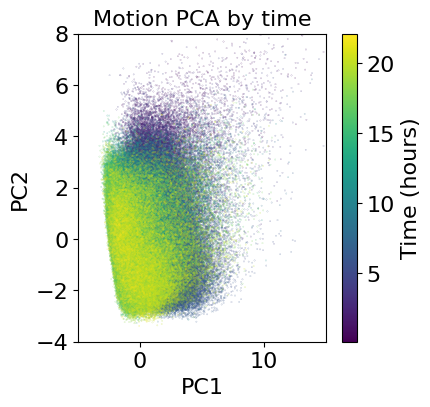

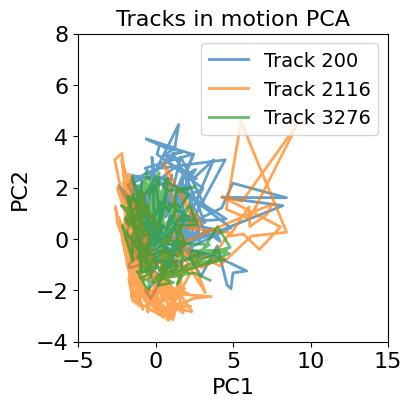

c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


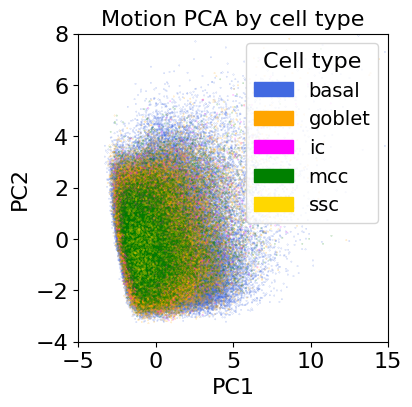

In [104]:
# Fit and transform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(full_df_normalized_cropped2[[feature for feature in ordered_features if feature in feature_categories['movement']]])  # Drop categorical column

# Convert PCA results to DataFrame
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])

pca_df['t_hours'] = full_df_normalized_cropped['t_hours'].values
pca_df['Spot track ID relabelled'] = full_df_normalized_cropped['Spot track ID relabelled'].values
pca_df['cell_type'] = full_df_normalized_cropped['cell_type'].values

pca_df_selected_annotated = pca_df[(pca_df['cell_type'] != 'unknown')]

pca_df_selected_annotated = pca_df_selected_annotated.sort_values(['cell_type', 't_hours']).reset_index(drop=True)

pca_df_selected = pca_df[(pca_df['Spot track ID relabelled'].isin(random_choices))]

pca_df_selected = pca_df_selected.sort_values(['Spot track ID relabelled', 't_hours']).reset_index(drop=True)

plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df['PC1'], pca_df['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df['t_hours'],  # Color by time
    cmap='viridis',
    rasterized=True
)

plt.colorbar(label='Time (hours)')  # Add color legend for time
plt.title('Motion PCA by time')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-5,15))
plt.ylim((-4,8))
#plt.savefig('plots_15_03/movement_PCA.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

plt.figure(figsize=(4, 4))

for track_id, group in pca_df_selected.groupby('Spot track ID relabelled'):  
    plt.plot(group["PC1"], group["PC2"], label=f'Track {track_id}', linewidth=2, alpha=0.7)
    
plt.title('Tracks in motion PCA')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-5,15))
plt.ylim((-4,8))
plt.legend()
#plt.savefig('plots_15_03/movement_PCA_tracks.pdf')
plt.show()

# Define color mapping for cell types
cell_type_colors = {'basal': 'royalblue', 'goblet': 'orange', 'ic': 'magenta', 'mcc': 'green', 'ssc': 'gold'}

plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df_selected_annotated['PC1'], pca_df_selected_annotated['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df_selected_annotated['cell_type'].map(cell_type_colors),  # Color by cell type
    rasterized = True
)

# Create legend handles
legend_patches = [mpatches.Patch(color=color, label=ctype) for ctype, color in cell_type_colors.items()]
plt.legend(handles=legend_patches, title="Cell type", frameon=True)

plt.title('Motion PCA by cell type')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-5,15))
plt.ylim((-4,8))
#plt.savefig('plots_15_03/movement_PCA_celltypes.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

100%|██████████| 358/358 [01:20<00:00,  4.45it/s]


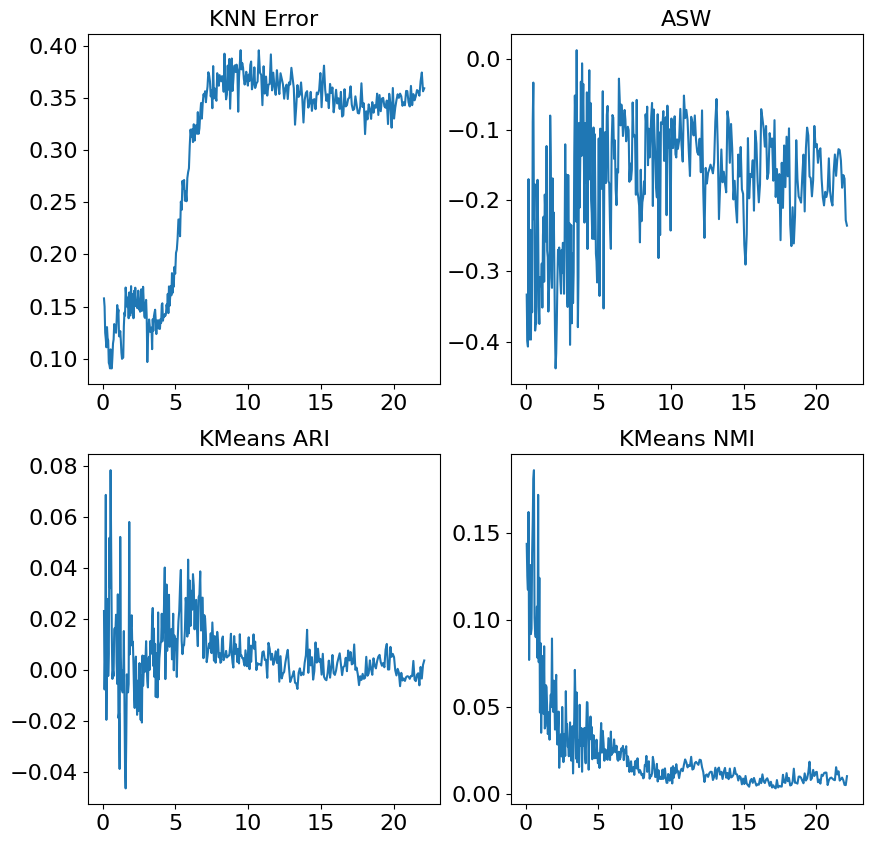

In [105]:
metrics = []

for t in tqdm(pca_df_selected_annotated['t_hours'].unique()):
    cur_df = pca_df_selected_annotated[pca_df_selected_annotated['t_hours'] == t]
    
    X = StandardScaler().fit_transform(cur_df[['PC1', 'PC2']].to_numpy())[:]
    y = cur_df['cell_type'].astype('category').cat.codes.to_numpy().reshape(-1,1).astype(np.float32)

    metrics.append([knn_error(X,y), kmeans_ari(X,y), kmeans_nmi(X,y), calc_asw(X,y)])


met_movement = np.array(metrics)

fig, ax = plt.subplots(2,2, figsize=(10,10))

ax[0][0].plot(pca_df_selected_annotated['t_hours'].unique(), met_movement[:,0])
ax[0][0].set_title('KNN Error')

ax[0][1].plot(pca_df_selected_annotated['t_hours'].unique(), met_movement[:,3])
ax[0][1].set_title('ASW')

ax[1][0].plot(pca_df_selected_annotated['t_hours'].unique(), met_movement[:,1])
ax[1][0].set_title('KMeans ARI')

ax[1][1].plot(pca_df_selected_annotated['t_hours'].unique(), met_movement[:,2])
ax[1][1].set_title('KMeans NMI')

#ax[0][0].set_ylim(0,1)
#ax[0][1].set_ylim(-1,1)
#ax[1][0].set_ylim(0,0.2)
#ax[1][1].set_ylim(0,0.2)


#plt.savefig('movement_pca_sep_metrics.pdf')

plt.show()

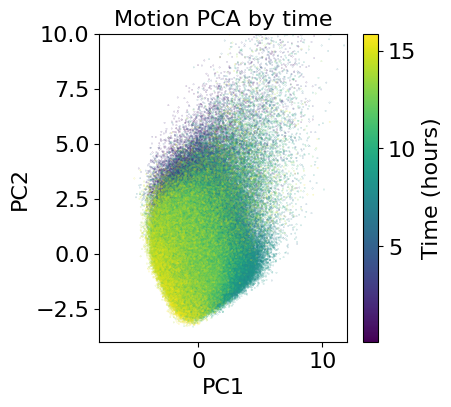

In [88]:
# Fit and transform PCA
pca = PCA(n_components=2)
pca_result_seconddataset = pca.fit_transform(full_df_normalized_cropped2_seconddataset[[feature for feature in ordered_features if feature in feature_categories['movement']]])  # Drop categorical column

# Convert PCA results to DataFrame
pca_df_seconddataset = pd.DataFrame(pca_result_seconddataset, columns=['PC1', 'PC2'])

pca_df_seconddataset['t_hours'] = full_df_normalized_cropped_seconddataset['t_hours'].values
pca_df_seconddataset['Spot track ID relabelled'] = full_df_normalized_cropped_seconddataset['Spot track ID relabelled'].values
pca_df_seconddataset['cell_type'] = full_df_normalized_cropped_seconddataset['cell_type'].values

plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df_seconddataset['PC1'], pca_df_seconddataset['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df_seconddataset['t_hours'],  # Color by time
    cmap='viridis',
    rasterized=True
)

plt.colorbar(label='Time (hours)')  # Add color legend for time
plt.title('Motion PCA by time')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-8,12))
plt.ylim((-4,10))
plt.savefig('plots_15_03/movement_PCA_seconddataset.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

In [ ]:
mov_shape_features = [feature for feature in ordered_features if feature in feature_categories['movement']]

# Combine the original data and the PCA results
combined_df = pd.concat([full_df_normalized_cropped2.reset_index(drop=True), pca_df], axis=1)

# Compute correlation matrix
correlation_with_pcs = combined_df.corr(method='spearman').loc[mov_shape_features, ['PC1', 'PC2']]

# Sort by absolute correlation with PC1
correlation_sorted_motion = correlation_with_pcs.reindex(
    correlation_with_pcs['PC1'].abs().sort_values(ascending=False).index
)

C:\Users\ghr283\AppData\Local\Temp\ipykernel_16936\3651198913.py:7: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_with_pcs = combined_df.corr(method='spearman').loc[mov_shape_features, ['PC1', 'PC2']]


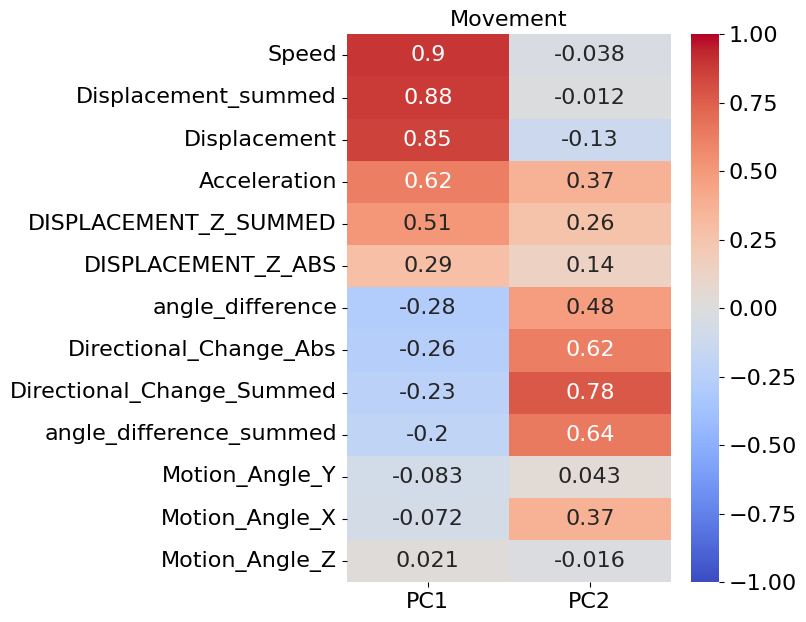

In [104]:
plt.figure(figsize=(8, len(mov_shape_features) * 0.5))
sns.heatmap(
    correlation_sorted_motion,
    annot=True,
    cmap='coolwarm',
    center=0,
    vmin=-1,     # Minimum value on the color scale
    vmax=1       # Maximum value on the color scale
)
plt.title('Movement')
plt.tight_layout()
plt.savefig('plots_15_03/movement_PCA_featurecorrelation.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()


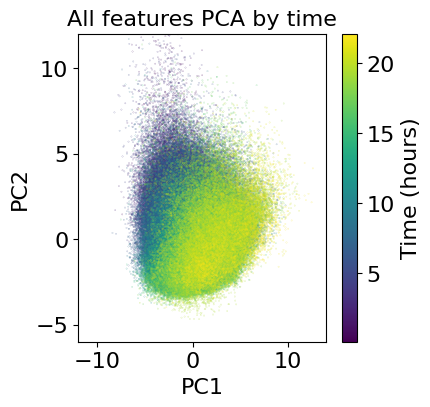

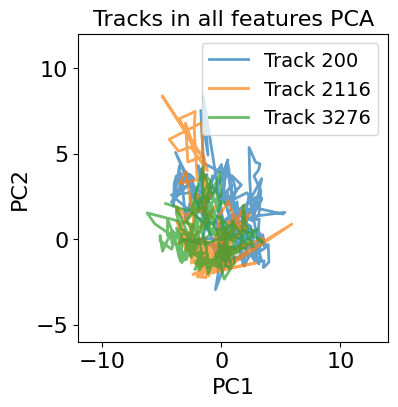

C:\Users\ghr283\AppData\Local\Temp\ipykernel_28396\1201171838.py:75: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('plots_15_03/all_PCA_celltypes.pdf', dpi=300, format='pdf', bbox_inches='tight')
C:\Users\ghr283\AppData\Local\Temp\ipykernel_28396\1201171838.py:75: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('plots_15_03/all_PCA_celltypes.pdf', dpi=300, format='pdf', bbox_inches='tight')
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


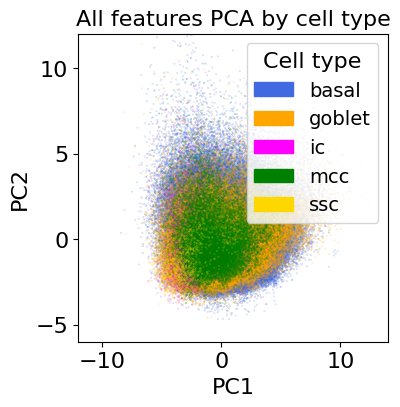

In [ ]:
# Fit and transform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(full_df_normalized_cropped2[ordered_features])  # Drop categorical column

# Convert PCA results to DataFrame
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])

pca_df['t_hours'] = full_df_normalized_cropped['t_hours'].values
pca_df['Spot track ID relabelled'] = full_df_normalized_cropped['Spot track ID relabelled'].values
pca_df['cell_type'] = full_df_normalized_cropped['cell_type'].values

pca_df_selected_annotated = pca_df[(pca_df['cell_type'] != 'unknown')]

pca_df_selected_annotated = pca_df_selected_annotated.sort_values(['cell_type', 't_hours']).reset_index(drop=True)

pca_df_selected = pca_df[(pca_df['Spot track ID relabelled'].isin(random_choices))]

pca_df_selected = pca_df_selected.sort_values(['Spot track ID relabelled', 't_hours']).reset_index(drop=True)

plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df['PC1'], pca_df['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df['t_hours'],  # Color by time
    cmap='viridis',
    rasterized=True
)

plt.colorbar(label='Time (hours)')  # Add color legend for time
plt.title('All features PCA by time')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-12,14))
plt.ylim((-6,12))
#plt.savefig('plots_15_03/all_PCA.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

plt.figure(figsize=(4, 4))

for track_id, group in pca_df_selected.groupby('Spot track ID relabelled'):  
    plt.plot(group["PC1"], group["PC2"], label=f'Track {track_id}', linewidth=2, alpha=0.7)
    
plt.title('Tracks in all features PCA')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-12,14))
plt.ylim((-6,12))
plt.legend()
#plt.savefig('plots_15_03/all_PCA_tracks_new.pdf')
plt.show()

# Define color mapping for cell types
cell_type_colors = {'basal': 'royalblue', 'goblet': 'orange', 'ic': 'magenta', 'mcc': 'green', 'ssc': 'gold'}

plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df_selected_annotated['PC1'], pca_df_selected_annotated['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df_selected_annotated['cell_type'].map(cell_type_colors),  # Color by cell type
    rasterized = True
)

# Create legend handles
legend_patches = [mpatches.Patch(color=color, label=ctype) for ctype, color in cell_type_colors.items()]
plt.legend(handles=legend_patches, title="Cell type", frameon=True)

plt.title('All features PCA by cell type')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-12,14))
plt.ylim((-6,12))
#plt.savefig('plots_15_03/all_PCA_celltypes.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

100%|██████████| 358/358 [01:20<00:00,  4.44it/s]


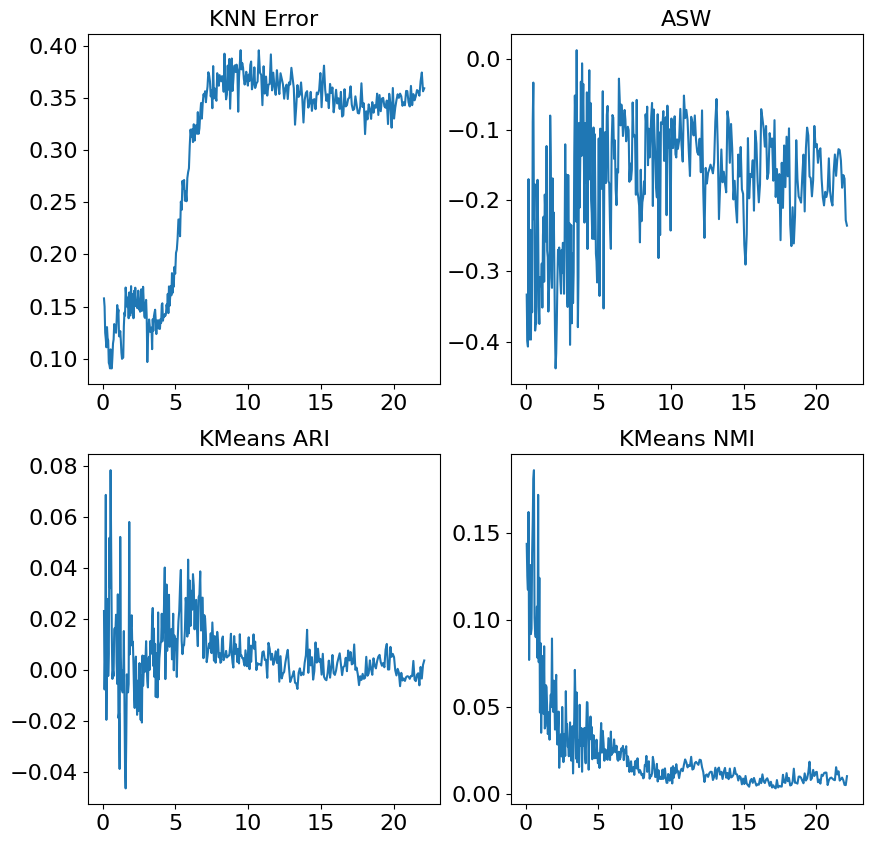

In [106]:
metrics = []

for t in tqdm(pca_df_selected_annotated['t_hours'].unique()):
    cur_df = pca_df_selected_annotated[pca_df_selected_annotated['t_hours'] == t]
    
    X = StandardScaler().fit_transform(cur_df[['PC1', 'PC2']].to_numpy())[:]
    y = cur_df['cell_type'].astype('category').cat.codes.to_numpy().reshape(-1,1).astype(np.float32)

    metrics.append([knn_error(X,y), kmeans_ari(X,y), kmeans_nmi(X,y), calc_asw(X,y)])


met_all = np.array(metrics)

fig, ax = plt.subplots(2,2, figsize=(10,10))

ax[0][0].plot(pca_df_selected_annotated['t_hours'].unique(), met_all[:,0])
ax[0][0].set_title('KNN Error')

ax[0][1].plot(pca_df_selected_annotated['t_hours'].unique(), met_all[:,3])
ax[0][1].set_title('ASW')

ax[1][0].plot(pca_df_selected_annotated['t_hours'].unique(), met_all[:,1])
ax[1][0].set_title('KMeans ARI')

ax[1][1].plot(pca_df_selected_annotated['t_hours'].unique(), met_all[:,2])
ax[1][1].set_title('KMeans NMI')

#ax[0][0].set_ylim(0,1)
#ax[0][1].set_ylim(-1,1)
#ax[1][0].set_ylim(0,0.2)
#ax[1][1].set_ylim(0,0.2)


#plt.savefig('allfeatures_pca_sep_metrics.pdf')

plt.show()

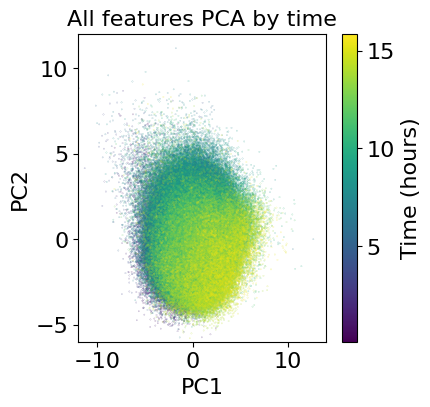

In [89]:
# Fit and transform PCA
pca = PCA(n_components=2)
pca_result_seconddataset = pca.fit_transform(full_df_normalized_cropped2_seconddataset[ordered_features])  # Drop categorical column

# Convert PCA results to DataFrame
pca_df_seconddataset = pd.DataFrame(pca_result_seconddataset, columns=['PC1', 'PC2'])

pca_df_seconddataset['t_hours'] = full_df_normalized_cropped_seconddataset['t_hours'].values
pca_df_seconddataset['Spot track ID relabelled'] = full_df_normalized_cropped_seconddataset['Spot track ID relabelled'].values
pca_df_seconddataset['cell_type'] = full_df_normalized_cropped_seconddataset['cell_type'].values


plt.figure(figsize=(4, 4))
scatter = plt.scatter(
    pca_df_seconddataset['PC1'], pca_df_seconddataset['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df_seconddataset['t_hours'],  # Color by time
    cmap='viridis',
    rasterized=True
)

plt.colorbar(label='Time (hours)')  # Add color legend for time
plt.title('All features PCA by time')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(False)
plt.xlim((-12,14))
plt.ylim((-6,12))
plt.savefig('plots_15_03/all_PCA_seconddataset.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

C:\Users\ghr283\AppData\Local\Temp\ipykernel_16936\3921999004.py:60: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
C:\Users\ghr283\AppData\Local\Temp\ipykernel_16936\3921999004.py:61: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('plots_15_03/all_PCA_celltypes_subplots.pdf', dpi=300, bbox_inches='tight')
C:\Users\ghr283\AppData\Local\Temp\ipykernel_16936\3921999004.py:61: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig('plots_15_03/all_PCA_celltypes_subplots.pdf', dpi=300, bbox_inches='tight')
c:\Users\ghr283\Anaconda3\envs\kapoorlabsenv3\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


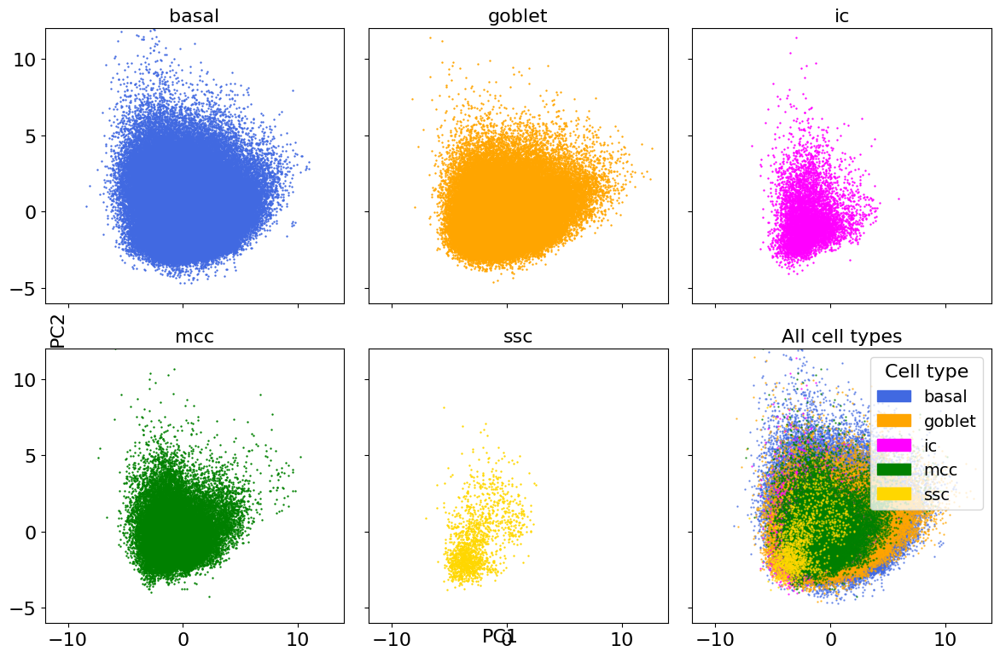

In [207]:
import matplotlib.patches as mpatches

# Define color mapping
cell_type_colors = {
    'basal': 'royalblue',
    'goblet': 'orange',
    'ic': 'magenta',
    'mcc': 'green',
    'ssc': 'gold'
}

# List of cell types
cell_types = list(cell_type_colors.keys())

# Create subplots
fig, axes = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
axes = axes.flatten()

# Plot each cell type separately
for i, ctype in enumerate(cell_types):
    ax = axes[i]
    subset = pca_df_selected_annotated[pca_df_selected_annotated['cell_type'] == ctype]
    
    ax.scatter(
        subset['PC1'], subset['PC2'],
        color=cell_type_colors[ctype],
        s=0.5,
        rasterized=True
    )
    ax.set_title(ctype)
    ax.set_xlim((-12, 14))
    ax.set_ylim((-6, 12))
    ax.grid(False)

# Final subplot: all cell types together
ax = axes[-1]
for ctype, color in cell_type_colors.items():
    subset = pca_df_selected_annotated[pca_df_selected_annotated['cell_type'] == ctype]
    ax.scatter(
        subset['PC1'], subset['PC2'],
        color=color,
        s=0.5,
        rasterized=True,
        label=ctype,
        alpha=0.7  # <-- transparency added here
    )

# Add legend to the final plot
legend_patches = [mpatches.Patch(color=color, label=ctype) for ctype, color in cell_type_colors.items()]
ax.legend(handles=legend_patches, title="Cell type", frameon=True)
ax.set_title("All cell types")
ax.set_xlim((-12, 14))
ax.set_ylim((-6, 12))
ax.grid(False)

# Add shared axis labels
fig.text(0.5, 0.04, 'PC1', ha='center')
fig.text(0.06, 0.5, 'PC2', va='center', rotation='vertical')

plt.tight_layout()
plt.savefig('plots_15_03/all_PCA_celltypes_subplots.pdf', dpi=300, bbox_inches='tight')
plt.show()


In [171]:
# Combine the original data and the PCA results
combined_df = pd.concat([full_df_normalized_cropped2.reset_index(drop=True), pca_df], axis=1)

# Compute correlation matrix
correlation_with_pcs = combined_df.corr().loc[ordered_features, ['PC1', 'PC2']]

# Sort by absolute correlation with PC1
correlation_sorted_all = correlation_with_pcs.reindex(
    correlation_with_pcs['PC1'].abs().sort_values(ascending=False).index
)

C:\Users\ghr283\AppData\Local\Temp\ipykernel_16936\2905514528.py:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_with_pcs = combined_df.corr().loc[ordered_features, ['PC1', 'PC2']]


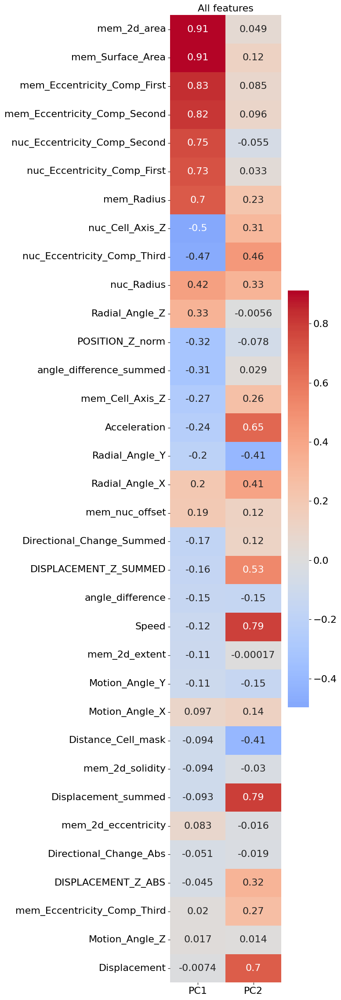

In [172]:
plt.figure(figsize=(8, len(columns_to_normalize) * 0.5))
sns.heatmap(correlation_sorted_all, annot=True, cmap='coolwarm', center=0)
plt.title('All features')
plt.tight_layout()
plt.savefig('plots_15_03/allfeatures_PCA_featurecorrelation.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

C:\Users\ghr283\AppData\Local\Temp\ipykernel_16936\1759553741.py:51: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


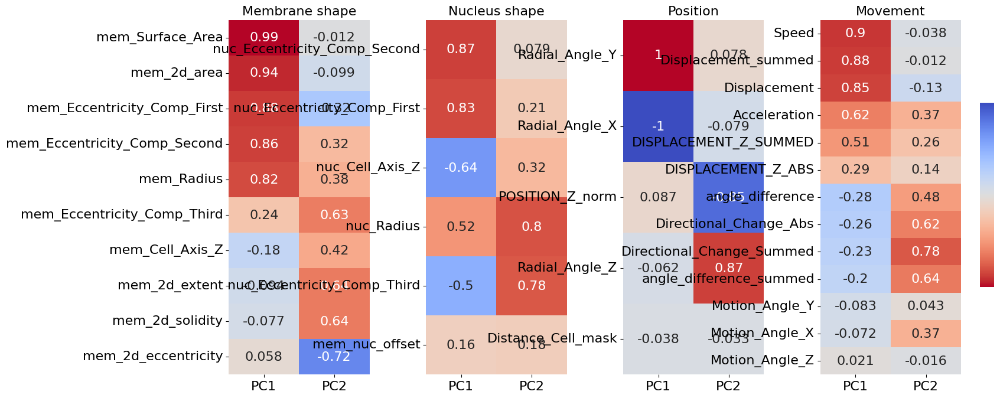

In [112]:
import matplotlib.gridspec as gridspec

# Correlation matrices and titles
correlation_matrices = [
    correlation_sorted_membrane,
    correlation_sorted_nucleus,
    correlation_sorted_position,
    correlation_sorted_motion
]

titles = ['Membrane shape', 'Nucleus shape', 'Position', 'Movement']
row_counts = [len(df) for df in correlation_matrices]
max_rows = max(row_counts)

# Create GridSpec with 1 row, 4 columns
fig = plt.figure(figsize=(4 * 4, max_rows * 0.6))  # width scales with #plots, height with max rows
gs = gridspec.GridSpec(nrows=1, ncols=4, figure=fig, wspace=0.4)

# Loop and plot each heatmap
axes = []
for i in range(4):
    ax = fig.add_subplot(gs[0, i])
    sns.heatmap(
        correlation_matrices[i],
        annot=True,
        cmap='coolwarm',
        center=0,
        vmin=-1,
        vmax=1,
        cbar=False,
        ax=ax
    )
    ax.set_title(titles[i])
    ax.tick_params(axis='y', labelrotation=0)
    axes.append(ax)

# Shared colorbar to the right
cbar_ax = fig.add_axes([0.92, 0.3, 0.015, 0.4])
sns.heatmap(
    correlation_matrices[0],  # dummy just for colorbar
    cmap='coolwarm',
    center=0,
    vmin=-1,
    vmax=1,
    cbar=True,
    cbar_ax=cbar_ax,
    xticklabels=False,
    yticklabels=False
)

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.savefig("plots_15_03/horizontal_feature_PCA_correlations.pdf", dpi=300, bbox_inches="tight")
plt.show()


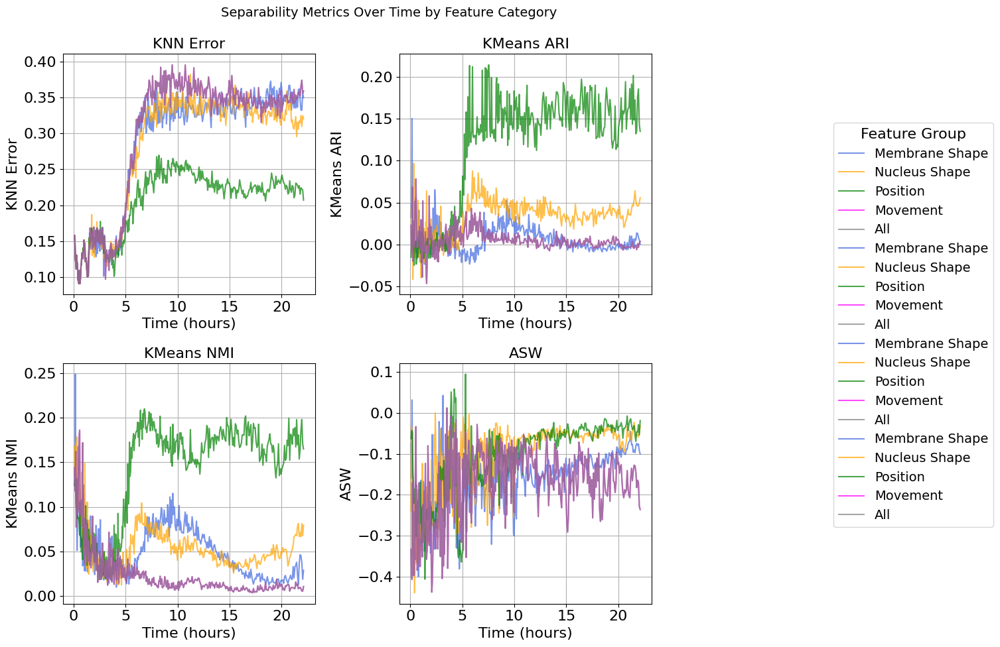

In [110]:
# Define all metrics
all_metrics_dict = {
    'membrane_shape': met_membrane,
    'nucleus_shape': met_nucleus,
    'position': met_position,
    'movement': met_movement,
    'all': met_all
}

# Category colors (add 'all' manually)
category_colors = {
    'membrane_shape': 'royalblue', 
    'nucleus_shape': 'orange',
    'position': 'green',
    'movement': 'magenta',
    'all': 'gray'
}

metric_names = ['KNN Error', 'KMeans ARI', 'KMeans NMI', 'ASW']
n_metrics = len(metric_names)
timepoints = pca_df_selected_annotated['t_hours'].unique()

fig, axs = plt.subplots(2, 2, figsize=(12, 10))
axs = axs.flatten()

for i in range(n_metrics):
    ax = axs[i]
    for group, metric_array in all_metrics_dict.items():
        ax.plot(
            timepoints,
            metric_array[:, i],
            label=group.replace('_', ' ').title(),
            color=category_colors[group],
            alpha=0.7
        )
    ax.set_title(metric_names[i])
    ax.set_xlabel("Time (hours)")
    ax.set_ylabel(metric_names[i])
    ax.grid(True)

# Finalize
fig.suptitle("Separability Metrics Over Time by Feature Category", fontsize=14)
fig.legend(title="Feature Group", bbox_to_anchor=(1.05, 0.5), loc="center left")
fig.tight_layout(rect=[0, 0, 0.85, 1])  # make space for legend
plt.savefig("plots_15_03/separability_metrics_over_time.pdf", dpi=300, bbox_inches="tight") 
plt.show()


### Boxplot

In [58]:
full_df_normalized_cropped

,Unnamed: 0,ID,Spot source ID,Track ID_x,Track ID_y,Spot frame,t,t_hours,POSITION_X,POSITION_Y,...,Directional_Change_Abs,Displacement_summed,Directional_Change_Summed,centroid_X,centroid_Y,centroid_to_cell_angle,angle_difference,angle_difference_summed,nucleus_shape_feature_distance,movement_feature_distance
2,2,2,1.0,19700.0,0,4,4.0,0.165556,641.585796,569.708138,...,0.274769,-0.152435,0.289955,746.521552,692.256699,-130.572749,-0.060673,1.299168,6.797153,432.247592
6,6,6,5.0,19700.0,0,8,8.0,0.331111,645.180282,569.727709,...,0.052263,-0.152435,0.289955,739.895345,701.994769,-125.606056,0.452893,1.299168,6.505441,551.773907
7,7,7,6.0,19700.0,0,9,9.0,0.372500,645.220679,570.929091,...,0.596681,-0.040909,0.556920,737.613889,705.899714,-124.393322,1.679522,1.686666,7.626410,580.172885
8,8,8,7.0,19700.0,0,10,10.0,0.413889,645.437847,570.030288,...,1.020756,0.100198,0.584346,739.488694,701.065530,-125.668981,-0.272551,2.112500,6.263628,549.283372
9,9,9,8.0,19700.0,0,11,11.0,0.455278,645.306807,569.397074,...,-0.592892,-0.009399,0.648527,735.206648,699.584887,-124.626616,-0.795286,2.498080,5.383350,423.315445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
746912,746912,702144,698240.0,372900.0,1960314,347,347.0,21.111944,448.694878,511.731887,...,-0.458701,-0.210646,0.191473,780.422522,757.570922,-143.458338,0.513179,0.676517,6.530671,304.899854
746913,746913,705575,702144.0,372900.0,1960314,348,348.0,21.195000,447.370847,513.298727,...,-0.857249,-0.163499,0.493339,780.612710,757.107888,-143.809743,0.457170,0.429353,6.445530,319.422663
746920,746920,730660,727189.0,372900.0,1960314,355,355.0,21.776389,440.002484,516.220736,...,-0.376126,-0.630778,2.581363,780.830608,763.539315,-144.033853,0.440102,-0.594561,6.742633,606.118182
746921,746921,734083,730660.0,372900.0,1960314,356,356.0,21.859444,439.384684,516.591231,...,-0.674734,-0.761450,1.930922,781.936286,763.705385,-144.193603,0.075143,-0.895188,6.522341,489.597884


In [173]:
from scipy.stats import spearmanr

feature_corrs = {feature: [] for feature in ordered_features}

for cell in tqdm(full_df_normalized_cropped['Track ID_y'].unique()):
    cell_df = full_df_normalized_cropped[full_df_normalized_cropped['Track ID_y'] == cell]
    if (cell_df['t_hours'].max() - cell_df['t_hours'].min()) >= 1:

        for feature in ordered_features:
            if feature in cell_df.columns:
                try:
                    corr, p = spearmanr(cell_df[feature], cell_df['t_hours'])
                    if not np.isnan(corr):
                        feature_corrs[feature].append(corr)
                except Exception as e:
                    pass  # skip feature if correlation fails

  0%|          | 0/4495 [00:00<?, ?it/s]

100%|██████████| 4495/4495 [01:52<00:00, 39.83it/s] 


In [174]:
# Long-form DataFrame for seaborn boxplot
plot_df = pd.DataFrame([
    {'Feature': feature, 'Correlation': corr}
    for feature, corrs in feature_corrs.items()
    for corr in corrs
])

In [176]:
# Map each feature to its category
feature_to_category = {
    feature: category
    for category, features in feature_categories.items()
    for feature in features
}

# Add 'Category' column to the plot_df
plot_df['Category'] = plot_df['Feature'].map(feature_to_category)

In [153]:
len(ordered_features)

34

In [177]:
len(plot_df['Feature'].unique())

34

In [151]:
len(columns_to_normalize)

46

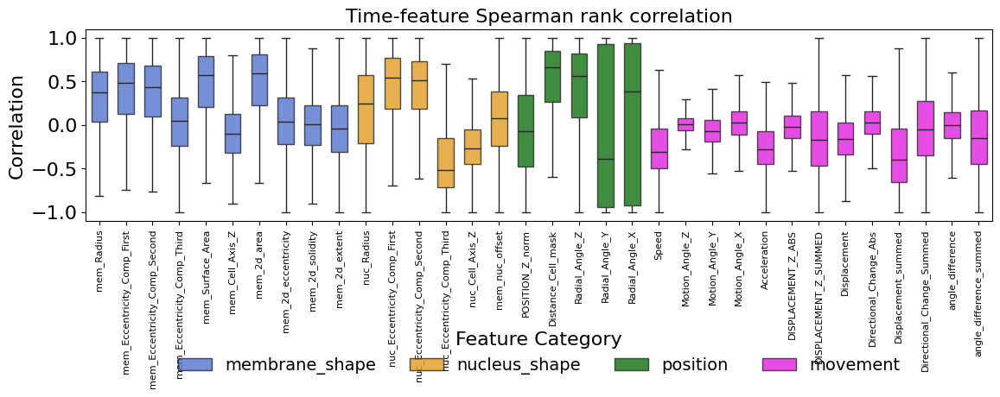

In [182]:
plt.figure(figsize=(12, 6))

# Desired legend order based on your dict keys
category_order = list(feature_categories.keys())

ax = sns.boxplot(
    data=plot_df,
    x='Feature',
    y='Correlation',
    hue='Category',         # Color by category
    order=ordered_features, # Maintain order from your dict
    hue_order=category_order,
    palette = {
    'membrane_shape': 'royalblue',
    'nucleus_shape': 'orange',
    'position': 'green',
    'movement': 'magenta'
    },
    showfliers=False,
    width=0.6   # <-- Try 0.6 to 1.0 for wider boxes
)

# Set box transparency
for patch in ax.patches:
    patch.set_alpha(0.8)  # adjust as needed

plt.xticks(rotation=90, fontsize=8)
plt.title('Time-feature Spearman rank correlation')
plt.legend(
    title='Feature Category',
    bbox_to_anchor=(0.5, -0.5),  # centered above the plot
    loc='upper center',
    ncol=len(feature_categories),  # one column per category
    frameon=False
)
plt.tight_layout()
plt.xlabel("")
plt.yticks(np.arange(-1, 1.05, 0.5))
plt.savefig('time_feature_correlation.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()

C:\Users\ghr283\AppData\Local\Temp\ipykernel_28904\3532251113.py:30: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Cell type", frameon=True)


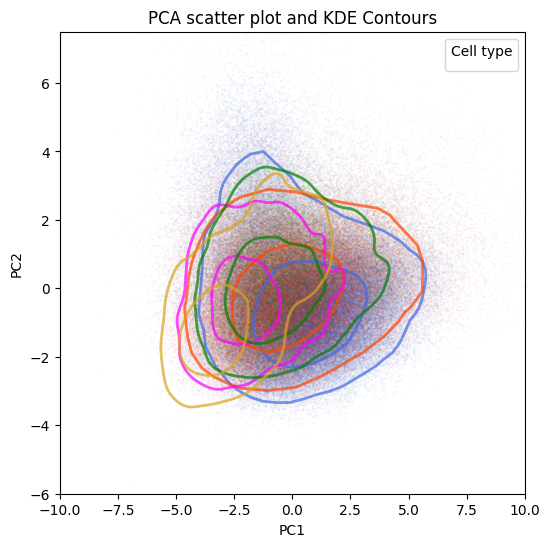

In [36]:
cell_type_colors = {'basal': 'royalblue', 'goblet': 'orangered', 'ic': 'magenta', 'mcc': 'green', 'ssc': 'goldenrod'}

plt.figure(figsize=(6, 6))

scatter = plt.scatter(
    pca_df_selected_annotated['PC1'], pca_df_selected_annotated['PC2'], 
    s=0.01,  # Smaller point size
    c=pca_df_selected_annotated['cell_type'].map(cell_type_colors),  # Color by cell type
    rasterized = True,
    alpha=0.2
)

# Loop through each cell type and plot KDE contours
for cell_type, group in pca_df_selected_annotated.groupby('cell_type'):
    sns.kdeplot(
        x=group['PC1'], y=group['PC2'], 
        color=cell_type_colors[cell_type],  # Color using the cell type colors
        fill=False,  # Only plot contours, no filled areas
        linewidths=2,  # Line thickness
        label=cell_type,  # For the legend
        levels=3,  # Show only the densest contour
        thresh=0.1,  # Threshold to plot only the high-density area
        alpha = 0.7
    )

# Set axis limits, labels, and grid
plt.title('PCA scatter plot and KDE Contours')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(title="Cell type", frameon=True)
plt.grid(False)
plt.xlim((-10, 10))
plt.ylim((-6, 7.5))

# Save the plot as PDF
plt.savefig('plots_15_03/all_PCA_celltypes_kde.pdf', dpi=300, format='pdf', bbox_inches='tight')
plt.show()


In [133]:
from matplotlib.collections import LineCollection

C:\Users\ghr283\AppData\Local\Temp\ipykernel_7704\2797845333.py:32: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Cell Type", loc="upper right")


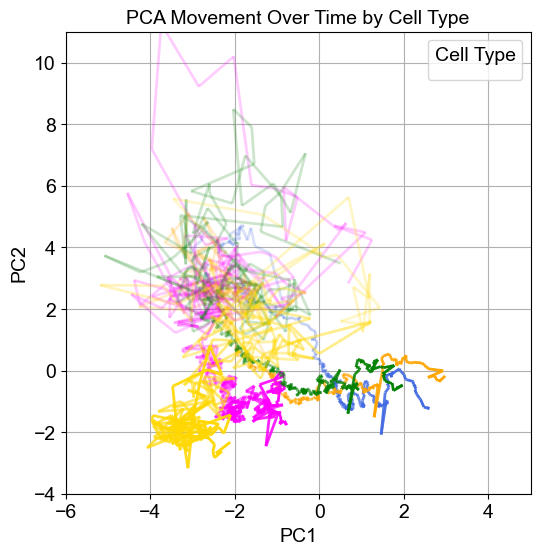

In [134]:


# Compute mean PC1 and PC2 per cell type and timepoint
pca_means = pca_df_selected_annotated.groupby(['t_hours', 'cell_type'])[['PC1', 'PC2']].mean().reset_index()

# Normalize alpha based on time (for transparency effect)
pca_means['alpha'] = (pca_means['t_hours'] / pca_means['t_hours'].max()).clip(lower=0.2)

plt.figure(figsize=(6, 6))

# Loop through each cell type
for cell_type, group in pca_means.groupby('cell_type'):
    group = group.sort_values('t_hours')  # Ensure time ordering
    
    # Extract PC1, PC2, and alpha values
    points = np.array([group["PC1"], group["PC2"]]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)  # Create line segments
    
    # Normalize alpha for the line segments (skip last point since it has no next segment)
    alphas = group["alpha"].values[:-1]  
    
    # Create LineCollection with varying alpha
    lc = LineCollection(segments, cmap="gray", norm=plt.Normalize(0, 1),
                        linewidth=2, alpha=0.7, color=cell_type_colors[cell_type])
    
    # Set individual alpha per segment
    lc.set_alpha(alphas)
    
    plt.gca().add_collection(lc)  # Add the line collection to the plot

plt.title("PCA Movement Over Time by Cell Type")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Cell Type", loc="upper right")
plt.grid(True)
plt.xlim((-6,5))
plt.ylim((-4,11))

plt.show()


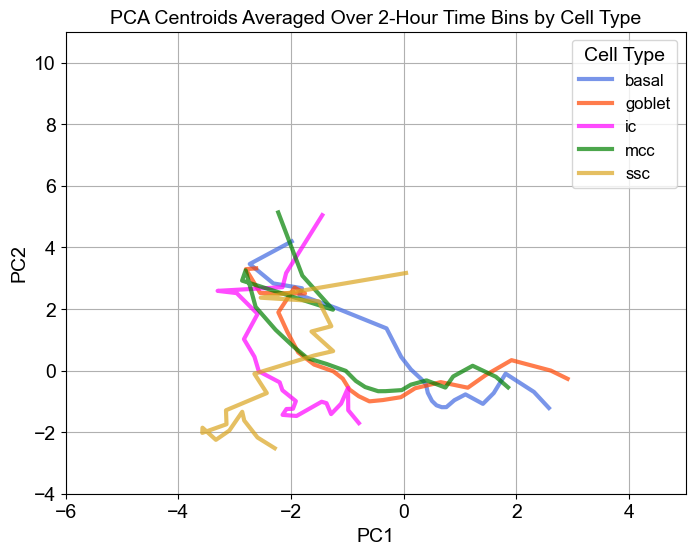

In [135]:
# Define color mapping for cell types
cell_type_colors = {'basal': 'royalblue', 'goblet': 'orangered', 'ic': 'magenta', 'mcc': 'green', 'ssc': 'goldenrod'}

# Define hour bins (e.g., 0-2, 2-4, ..., 22-24)
bin_edges = np.arange(0, 24, 1)
pca_df_selected_annotated["t_bin"] = pd.cut(pca_df_selected_annotated["t_hours"], bins=bin_edges, include_lowest=True, right=False)

# Compute mean PC1 and PC2 per time bin and cell type
pca_binned_means = pca_df_selected_annotated.groupby(['t_bin', 'cell_type'])[['PC1', 'PC2']].mean().reset_index()

plt.figure(figsize=(8, 6))

# Loop through each cell type to scatter plot the time-binned centroids
for cell_type, group in pca_binned_means.groupby('cell_type'):
    plt.plot(group["PC1"], group["PC2"], alpha=0.7, label=cell_type, linewidth = 3, color=cell_type_colors[cell_type])

# Adding labels, grid, and legend
plt.title("PCA Centroids Averaged Over 2-Hour Time Bins by Cell Type")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Cell Type", loc="upper right")
plt.grid(True)
plt.xlim((-6, 5))
plt.ylim((-4, 11))

plt.show()


C:\Users\ghr283\AppData\Local\Temp\ipykernel_7704\2439761122.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


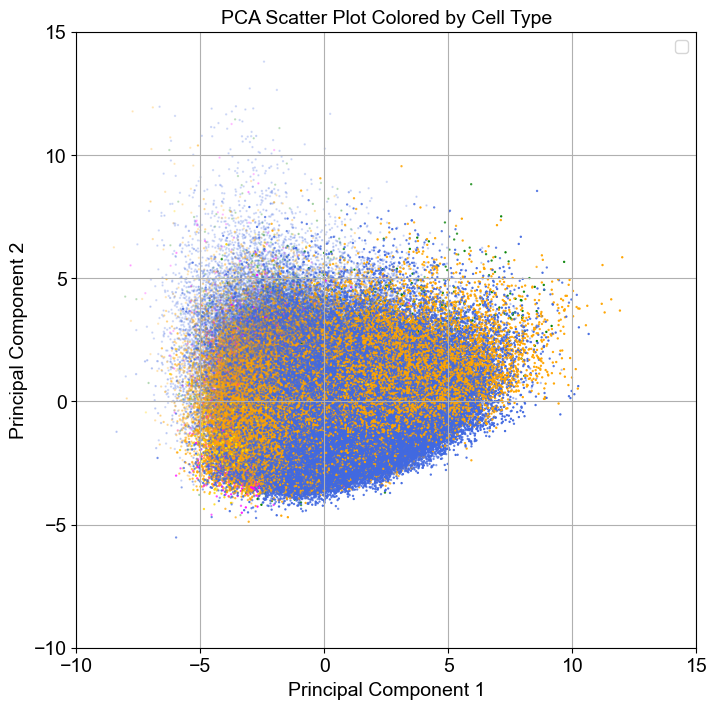

In [136]:
# Fit and transform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(full_df_normalized_cropped2)  # Drop categorical column

# Convert PCA results to DataFrame
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
pca_df['cell_type'] = full_df_normalized_cropped['cell_type'].values
pca_df['t_hours'] = full_df_normalized_cropped['t_hours'].values  # Add back cell_type

# Remove rows where cell_type is 'unknown'
pca_df_cropped = pca_df[pca_df['cell_type'] != 'unknown']

# Define color mapping for cell types
cell_type_colors = {'basal': 'royalblue', 'goblet': 'orange', 'ic': 'magenta', 'mcc': 'green', 'ssc': 'gold'}

plt.figure(figsize=(8, 8))
scatter = plt.scatter(
    pca_df_cropped['PC1'], pca_df_cropped['PC2'], 
    c=pca_df_cropped['cell_type'].map(cell_type_colors),  # Color by cell type
    s=0.5,  # Smaller point size
    alpha = (pca_df_cropped['t_hours'] / pca_df_cropped['t_hours'].max()).clip(lower=0.2)  # Normalize alpha (0 to 1)
)
plt.title('PCA Scatter Plot Colored by Cell Type')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.xlim((-10,15))
plt.ylim((-10,15))
plt.legend()
plt.show()

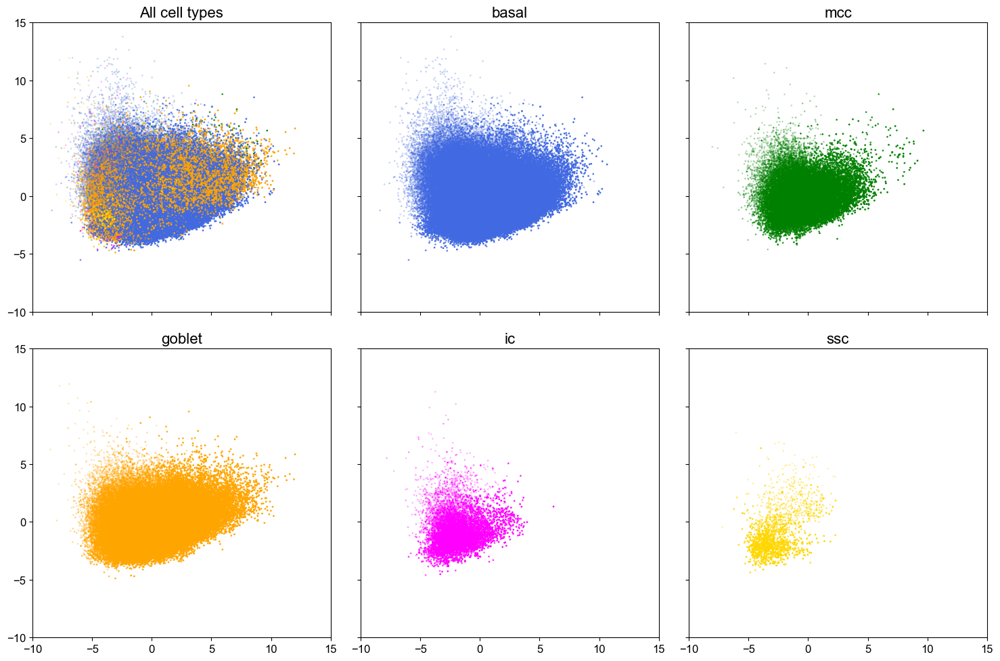

In [137]:
# Get unique cell types
cell_types = pca_df_cropped['cell_type'].unique()
num_plots = len(cell_types) + 1  # One for all + one per class

# Define subplot grid size (adjust based on number of plots)
rows = (num_plots // 3) + (num_plots % 3 > 0)  # Ensures enough rows
cols = min(3, num_plots)  # Max 3 columns per row

# Set global font size for all text elements
plt.rcParams.update({
    'font.size': 14,          # Base font size
    'axes.titlesize': 16,     # Title font size
    'axes.labelsize': 14,     # Axis labels font size
    'xtick.labelsize': 12,    # X-axis tick font size
    'ytick.labelsize': 12,    # Y-axis tick font size
    'legend.fontsize': 12     # Legend font size
})

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows), sharex=True, sharey=True)
axes = axes.flatten()  # Flatten to 1D for easier indexing

# Normalize alpha values (ensuring min 0.2)
alpha_values = (pca_df_cropped['t_hours'] / pca_df_cropped['t_hours'].max()).clip(lower=0.2).values  # Convert to NumPy array

# Set fixed x and y limits
x_min, x_max = -10, 15
y_min, y_max = -10, 15

# First plot: All cell types together
axes[0].scatter(
    pca_df_cropped['PC1'], pca_df_cropped['PC2'], 
    c=pca_df_cropped['cell_type'].map(cell_type_colors), 
    alpha=alpha_values, s=1
)
axes[0].set_title('All cell types')
axes[0].set_xlim(x_min, x_max)
axes[0].set_ylim(y_min, y_max)

# Individual plots for each cell type
for i, cell_type in enumerate(cell_types):
    subset_df = pca_df_cropped[pca_df_cropped['cell_type'] == cell_type]  # Filter data for the specific class
    alpha_subset = (subset_df['t_hours'] / subset_df['t_hours'].max()).clip(lower=0.2).values  # Normalize

    axes[i+1].scatter(
        subset_df['PC1'], subset_df['PC2'], 
        c=[cell_type_colors[cell_type]] * len(subset_df),  # Apply single color per class
        alpha=alpha_subset, s=1
    )
    axes[i+1].set_title(cell_type)
    axes[i+1].set_xlim(x_min, x_max)  # Set same x limits
    axes[i+1].set_ylim(y_min, y_max)  # Set same y limits

# Hide unused subplots (if num_plots < total grid size)
for i in range(num_plots, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

In [101]:
import matplotlib as mpl

# Set global font style and sizes         
mpl.rcParams['font.size'] = 18                 # Base font size
mpl.rcParams['axes.titlesize'] = 18            # Title font size
mpl.rcParams['axes.labelsize'] = 18            # Axis label font size
mpl.rcParams['xtick.labelsize'] = 18           # X-tick font size
mpl.rcParams['ytick.labelsize'] = 18           # Y-tick font size
mpl.rcParams['legend.fontsize'] = 18            # Legend font size
mpl.rcParams['figure.titlesize'] = 18          # Figure title font size

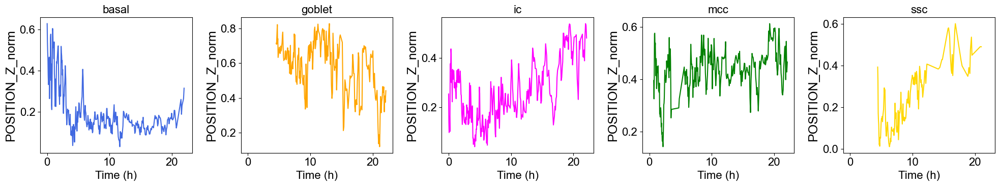

In [146]:
# Define color mapping for cell types
cell_type_colors = {'basal': 'royalblue', 'goblet': 'orange', 'ic': 'magenta', 'mcc': 'green', 'ssc': 'gold'}

# Create subplots (4 rows for categories, 5 columns for cell types)
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 4), sharex=True, sharey=False)

# Flatten axes for easier indexing
axes = axes.flatten()

row_idx = 0

# Loop through each cell type (columns)
for col_idx, (cell_type, color) in enumerate(cell_type_colors.items()):
    
    # Subset dataframe for the current cell type
    df_cell = selected_df[selected_df['cell_type'] == cell_type]
        
    # Get the corresponding subplot
    ax = axes[col_idx]  # 4 rows * 5 columns
        
    # Plot the highest PCA-loading feature for this category
    sns.lineplot(data=df_cell, x='t_hours', y='POSITION_Z_norm', ax=ax, color=color)

    # Set consistent y-limits for the row
    #ax.set_ylim(y_limits[row_idx])

    # Increase font sizes
    ax.set_title(f"{cell_type}" if row_idx == 0 else "", fontsize=16)  # Larger title font
    ax.set_xlabel("Time (h)", fontsize=16)  # Larger x-label
    #ax.set_ylabel(format_feature_name(feature) if col_idx == 0 else "", fontsize=12)  # Larger y-label

    # Increase tick label font size
    ax.tick_params(axis='both', labelsize=16)  

# Adjust layout and show the figure
plt.tight_layout()
plt.show()